In [1]:
#手の表面を1フレームずつ画像に変換処理--(pro1)
import cv2
import os

inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura","saitouhideakiomote",
      "saitouhideakiura","saitouryougaomote","saitouryougaura","sakumaomote","sakumaura",
      "tanakaomote","tanakaura","tochiomote","tochiura","tokuyamaomote","tokuyamaura",
      "watanabeomote","watanabeura","yamaguchiomote","yamaguchiura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","saitouhide/omote","saitouhide/ura","saitouryou/omote",
       "saitouryou/ura","sakuma/omote","sakuma/ura","tanaka/omote","tanaka/ura","tochikubo/omote",
       "tochikubo/ura","tokuyama/omote","tokuyama/ura","watanabe/omote","watanabe/ura",
       "yamaguchi/omote","yamaguchi/ura"]
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura","tochiomote","tochiura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","tochikubo/omote","tochikubo/ura"]
'''
for i in range(30):#変更必要
    save_dir="./grayhands/"+str(output[i])
    cap=cv2.VideoCapture("./MOV/"+str(inputname[i])+".MOV")
    if not cap.isOpened():
        sys.exit()
    n= 0
    while True:
        # read()でフレーム画像が読み込めたかを示すbool、フレーム画像の配列ndarrayのタプル
        is_image,frame_img = cap.read()
        if is_image:
            # 画像を保存
            outfile=save_dir+"/"+str(n)+".jpg"
            #グレイスケール化
            im_gray = cv2.cvtColor(frame_img, cv2.COLOR_BGR2GRAY)
            cv2.imwrite(outfile, im_gray)
        else:
            # フレーム画像が読込なかったら終了
            break
        n += 1

    cap.release()
    print(str(output[i])+":ok")

arai/omote:ok
arai/ura:ok
gotou/omote:ok
gotou/ura:ok
isii/omote:ok
isii/ura:ok
mimura/omote:ok
mimura/ura:ok
mine/omote:ok
mine/ura:ok
nakamura/omote:ok
nakamura/ura:ok
okutani/omote:ok
okutani/ura:ok
saitouhide/omote:ok
saitouhide/ura:ok
saitouryou/omote:ok
saitouryou/ura:ok
sakuma/omote:ok
sakuma/ura:ok
tanaka/omote:ok
tanaka/ura:ok
tochikubo/omote:ok
tochikubo/ura:ok
tokuyama/omote:ok
tokuyama/ura:ok
watanabe/omote:ok
watanabe/ura:ok
yamaguchi/omote:ok
yamaguchi/ura:ok


In [6]:
#画像ファイルを読み込んでNumpy形式に変換--(pro2)
import numpy as np
from PIL import Image
import cv2
import os,glob,random

outfile="./num16graylight128.npz"#変更必要
max_photo=40000
photo_size=128#変更必要
x=[]
y=[]

def main():
    glob_files("./grayhands/mine/omote",0)
    glob_files("./grayhands/mine/ura",1)
    glob_files("./grayhands/okutani/omote",2)
    glob_files("./grayhands/okutani/ura",3)
    glob_files("./grayhands/tochikubo/omote",4)
    glob_files("./grayhands/tochikubo/ura",5)
    glob_files("./grayhands/nakamura/omote",6)
    glob_files("./grayhands/nakamura/ura",7)
    glob_files("./grayhands/gotou/omote",8)
    glob_files("./grayhands/gotou/ura",9)
    glob_files("./grayhands/mimura/omote",10)
    glob_files("./grayhands/mimura/ura",11)
    glob_files("./grayhands/arai/omote",12)
    glob_files("./grayhands/arai/ura",13)
    glob_files("./grayhands/isii/omote",14)
    glob_files("./grayhands/isii/ura",15)
    #glob_files("./hands/saitouhide/omote",16)
    #glob_files("./hands/saitouhide/ura",17)
    #glob_files("./hands/saitouryou/omote",18)
    #glob_files("./hands/saitouryou/ura",19)
    #glob_files("./hands/sakuma/omote",20)
    #glob_files("./hands/sakuma/ura",21)
    #glob_files("./hands/tanaka/omote",22)
    #glob_files("./hands/tanaka/ura",23)
    #glob_files("./hands/tokuyama/omote",24)
    #glob_files("./hands/tokuyama/ura",25)
    #glob_files("./hands/watanabe/omote",26)
    #glob_files("./hands/watanabe/ura",27)
    #glob_files("./hands/yamaguchi/omote",28)
    #glob_files("./hands/yamaguchi/ura",29)
    
    
    #glob_files("./hands/sekine/omote",30)
    #glob_files("./hands/sekine/ura",31)
    #glob_files("./hands/toriumi/omote",32)
    #glob_files("./hands/toriumi/ura",33)
    #glob_files("./hands/aizawa/omote",34)
    #glob_files("./hands/aizawa/ura",35)
    np.savez(outfile,x=x,y=y)
    print("保存しました:"+outfile,len(x))
    print(x[0],y[0])
    
def glob_files(path,label):
    files=glob.glob(path+"/*.jpg")
    random.shuffle(files)
    num=0
    for f in files:
        if num>=max_photo: break
        num+=1
        #img=Image.open(f)#RGBのコード
        #img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)#GRAYスケールの時のコード
        #img=img.resize((photo_size,photo_size))
        #img= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        #---------Grayscaleの時のプログラム--------------
        img=cv2.imread(f)
        img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        img=cv2.resize(img_gray,(photo_size,photo_size))
        
        
        img=np.asarray(img)#1つの配列に格納（この場合2つ）
        x.append(img)
        y.append(label)
if __name__=='__main__':
    main()

保存しました:./num16graylight128.npz 3366
[[136 130 131 ... 181 182 181]
 [130 131 129 ... 191 193 190]
 [135 131 131 ... 194 194 194]
 ...
 [158 159 160 ... 146 146 144]
 [156 157 158 ... 144 144 143]
 [155 156 159 ... 147 143 141]] 0


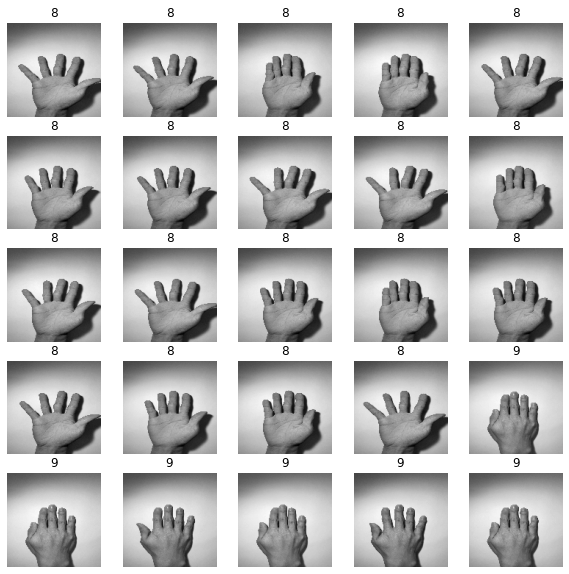

In [7]:
#pro2のnumpyファイルが正しく保存されているかの確認プログラム
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
#写真データ読み込み
photos=np.load('./num14graylight128.npz')
x=photos['x']
y=photos['y']
#開始インデックス
idx=1900
#pyplotで出力
plt.figure(figsize=(10,10))
plt.axis("off")


for i in range(25):
    plt.subplot(5,5,i+1)
    plt.axis("off")
    plt.title(y[i+idx])
    plt.imshow(x[i+idx],cmap='gray')

#--------------------画像1枚をピックアップして保存する-----------------------------
#plt.imshow(x[0],cmap='gray')
#plt.savefig('./extract.jpg')
plt.show()

Epoch 1/20
85/85 [==============================] - 67s 787ms/step - loss: 0.9840 - accuracy: 0.7418 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 2/20
85/85 [==============================] - 66s 773ms/step - loss: 0.0087 - accuracy: 0.9974 - val_loss: 2.3347e-08 - val_accuracy: 1.0000
Epoch 3/20
85/85 [==============================] - 66s 779ms/step - loss: 0.2202 - accuracy: 0.9874 - val_loss: 7.2870e-08 - val_accuracy: 1.0000
Epoch 4/20
85/85 [==============================] - 66s 777ms/step - loss: 0.0487 - accuracy: 0.9889 - val_loss: 2.9943e-07 - val_accuracy: 1.0000
Epoch 5/20
85/85 [==============================] - 65s 761ms/step - loss: 0.0011 - accuracy: 0.9996 - val_loss: 7.0747e-10 - val_accuracy: 1.0000
Epoch 6/20
85/85 [==============================] - 65s 765ms/step - loss: 1.8985e-06 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/20
85/85 [==============================] - 65s 761ms/step - loss: 5.8587e-06 - accuracy: 1.0000 - val_loss: 0

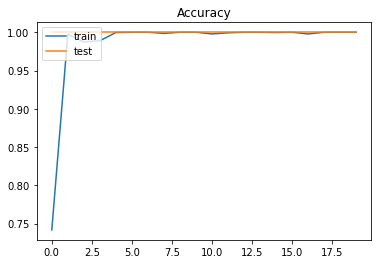

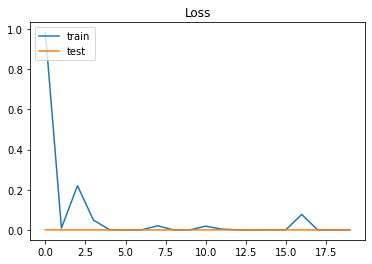

Wall time: 21min 41s


In [8]:
%%time
#CNNモデルの構築とCNNモデルを用いた機械学習--(pro3)
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes, activation='softmax'))
    return model

def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model


im_rows = 128 # 変更必要
im_cols = 128 # 変更必要
im_color = 1
in_shape = (im_rows, im_cols, im_color)
nb_classes = 16 #変更必要

photos = np.load('./num16graylight128.npz')#変更必要
x = photos['x']
y = photos['y']

x = x.reshape(-1, im_rows, im_cols, im_color)
x = x.astype('float32') / 255
y = keras.utils.to_categorical(y.astype('int32'), nb_classes)

x_train, x_test, y_train, y_test = train_test_split(
    x, y, train_size=0.8)

model = get_model(in_shape, nb_classes)


hist = model.fit(x_train, y_train,
          batch_size=32,
          epochs=20,
          verbose=1,
          validation_data=(x_test, y_test))

score = model.evaluate(x_test, y_test, verbose=1)
print('正解率=', score[1], 'loss=', score[0])


plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

model.save_weights('./hdf/num16graylight128pix.hdf5') #変更必要


ここからは0番目の写真です


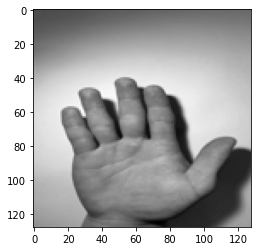

可能性が 96.83349132537842 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは1番目の写真です


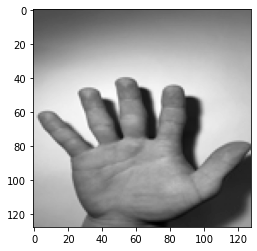

可能性が 59.90811586380005 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは2番目の写真です


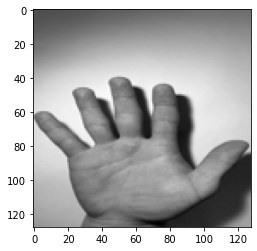

この写真は、 新井さんの表 です。
可能性は、 99.62843060493469 %です。

ここからは3番目の写真です


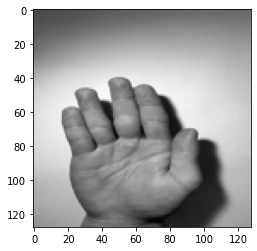

可能性が 89.99484181404114 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは4番目の写真です


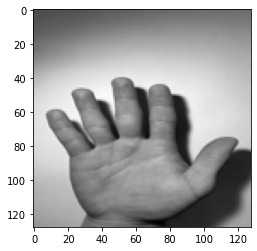

この写真は、 新井さんの表 です。
可能性は、 99.99936819076538 %です。

ここからは5番目の写真です


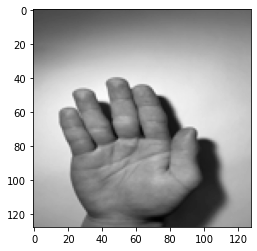

可能性が 58.782392740249634 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは6番目の写真です


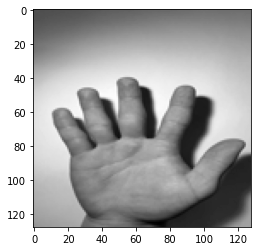

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは7番目の写真です


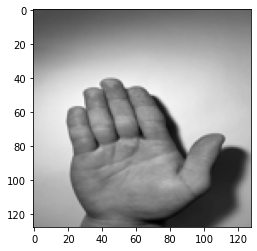

この写真は、 新井さんの表 です。
可能性は、 99.99994039535522 %です。

ここからは8番目の写真です


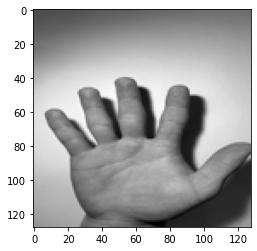

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは9番目の写真です


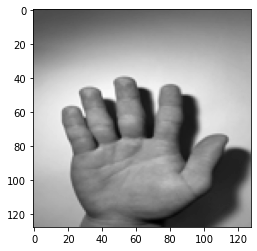

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは10番目の写真です


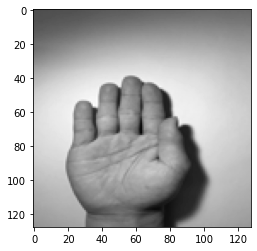

可能性が 96.70648574829102 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは11番目の写真です


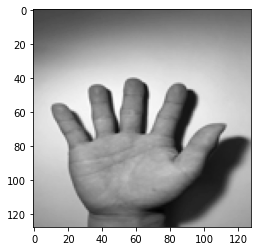

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは12番目の写真です


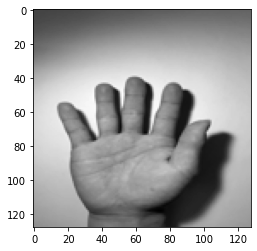

この写真は、 新井さんの表 です。
可能性は、 99.99929666519165 %です。

ここからは13番目の写真です


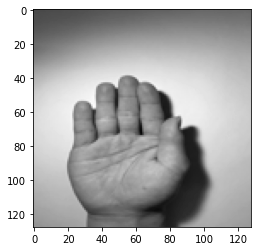

可能性が 95.33502459526062 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは14番目の写真です


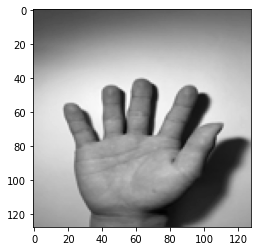

この写真は、 三村君の表 です。
可能性は、 99.99998807907104 %です。

ここからは15番目の写真です


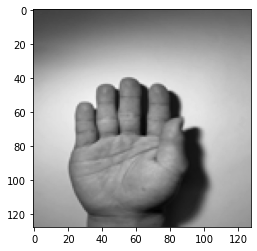

この写真は、 新井さんの表 です。
可能性は、 99.99992847442627 %です。

ここからは16番目の写真です


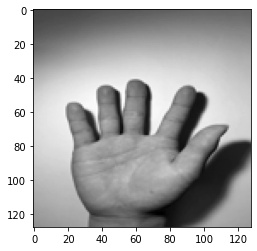

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは17番目の写真です


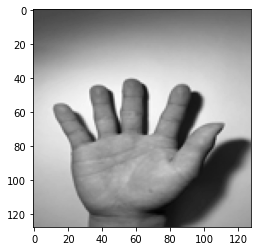

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは18番目の写真です


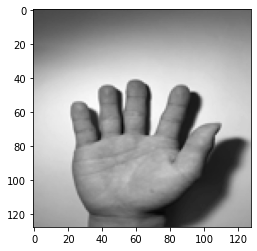

可能性が 98.65532517433167 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは19番目の写真です


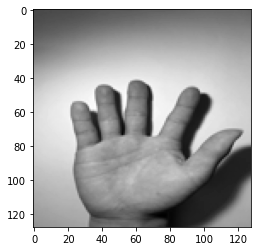

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは20番目の写真です


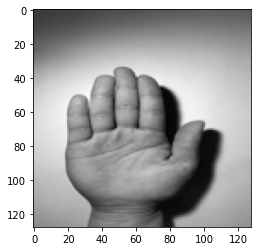

可能性が 73.49344491958618 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは21番目の写真です


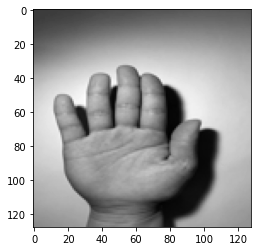

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは22番目の写真です


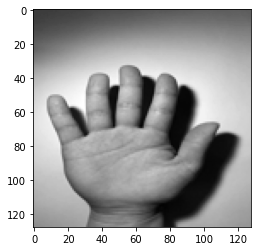

この写真は、 三村君の表 です。
可能性は、 99.99945163726807 %です。

ここからは23番目の写真です


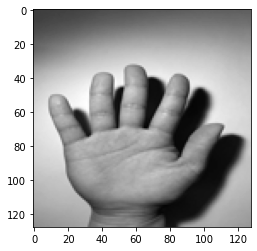

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは24番目の写真です


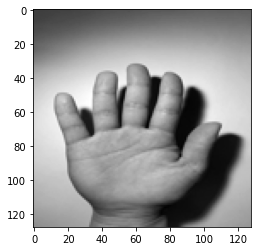

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは25番目の写真です


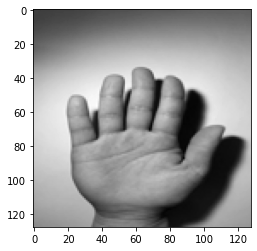

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは26番目の写真です


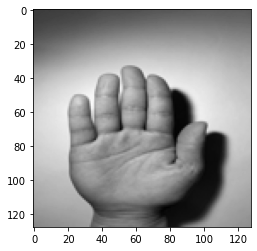

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは27番目の写真です


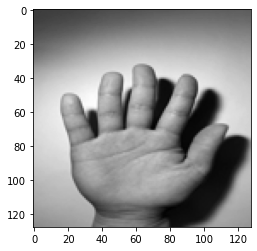

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは28番目の写真です


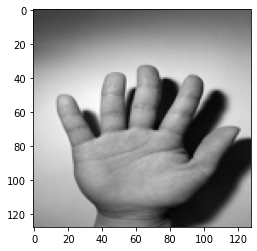

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは29番目の写真です


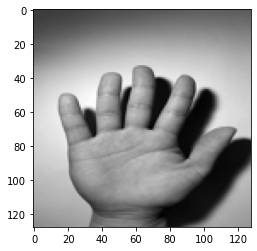

この写真は、 三村君の表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは30番目の写真です


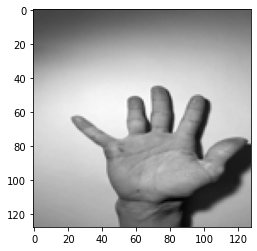

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは31番目の写真です


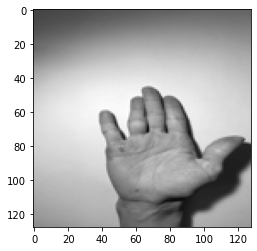

この写真は、 三村君の表 です。
可能性は、 99.9024510383606 %です。

ここからは32番目の写真です


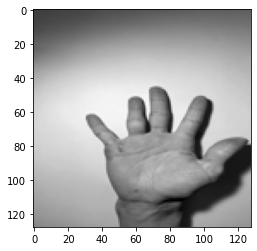

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは33番目の写真です


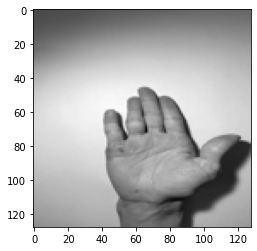

この写真は、 三村君の表 です。
可能性は、 99.98100399971008 %です。

ここからは34番目の写真です


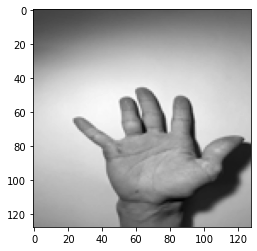

可能性が 97.46904373168945 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは35番目の写真です


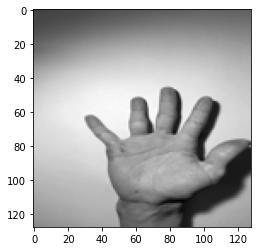

可能性が 73.96575212478638 %なので認証できません。
認証の結果は 石井さんの表 でした。

ここからは36番目の写真です


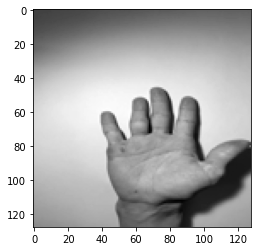

この写真は、 三村君の表 です。
可能性は、 99.64480400085449 %です。

ここからは37番目の写真です


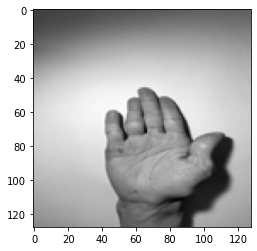

この写真は、 三村君の表 です。
可能性は、 99.99560117721558 %です。

ここからは38番目の写真です


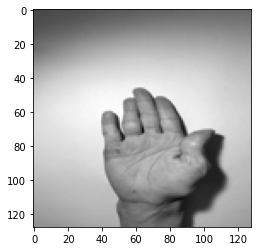

この写真は、 三村君の表 です。
可能性は、 99.23614263534546 %です。

ここからは39番目の写真です


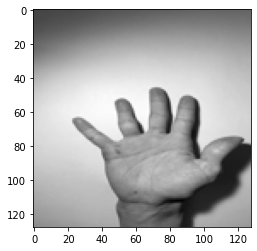

この写真は、 三村君の表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは40番目の写真です


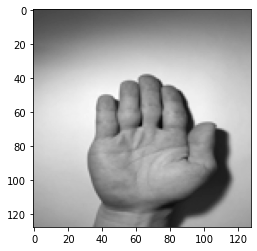

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは41番目の写真です


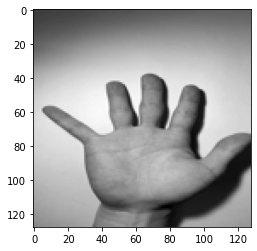

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは42番目の写真です


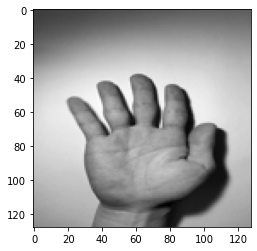

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは43番目の写真です


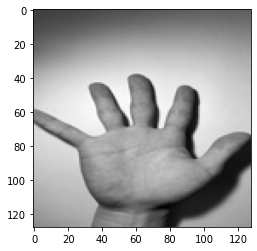

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは44番目の写真です


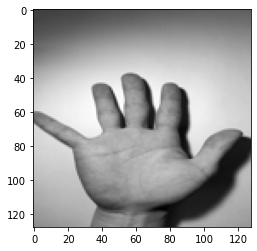

この写真は、 三村君の表 です。
可能性は、 99.99797344207764 %です。

ここからは45番目の写真です


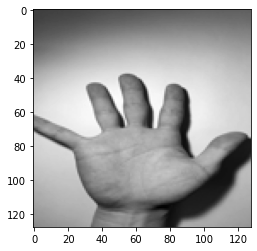

可能性が 95.84290385246277 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは46番目の写真です


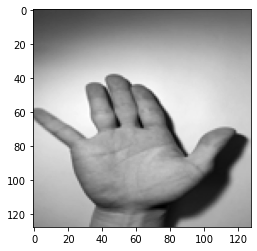

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは47番目の写真です


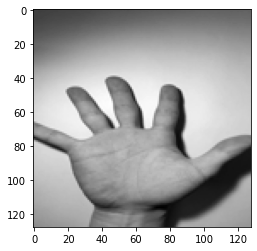

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは48番目の写真です


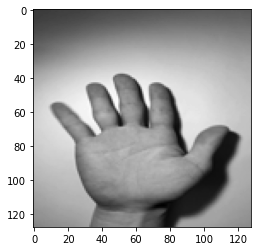

この写真は、 三村君の表 です。
可能性は、 99.99760389328003 %です。

ここからは49番目の写真です


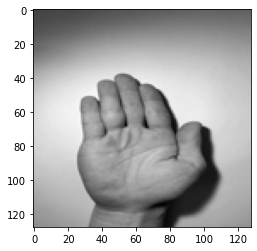

この写真は、 三村君の表 です。
可能性は、 99.99998807907104 %です。
テスト対象の人が変わります

ここからは50番目の写真です


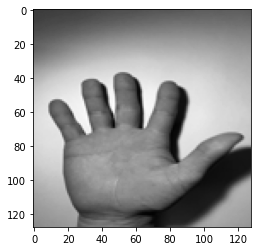

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは51番目の写真です


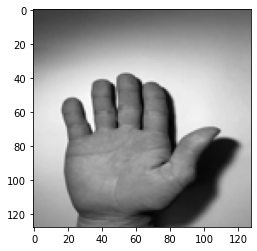

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは52番目の写真です


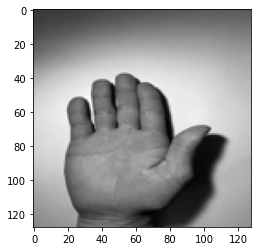

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは53番目の写真です


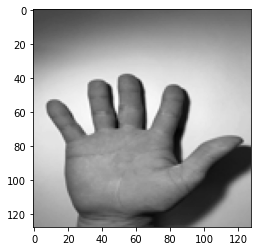

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは54番目の写真です


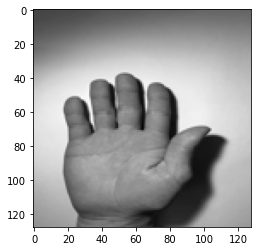

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは55番目の写真です


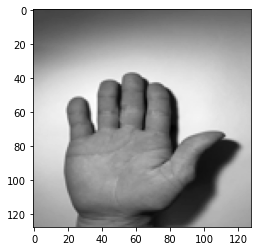

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは56番目の写真です


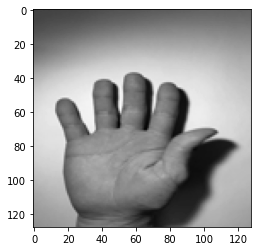

この写真は、 新井さんの表 です。
可能性は、 99.99988079071045 %です。

ここからは57番目の写真です


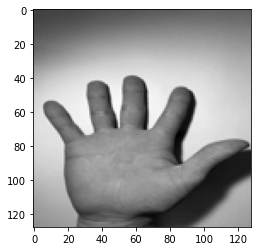

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは58番目の写真です


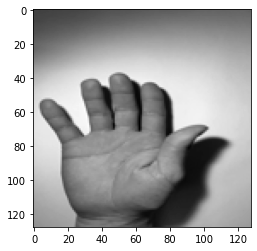

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは59番目の写真です


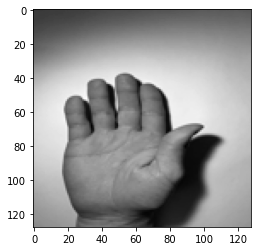

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは60番目の写真です


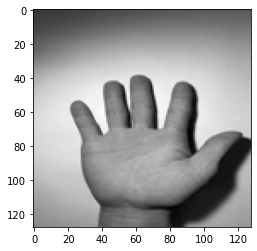

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは61番目の写真です


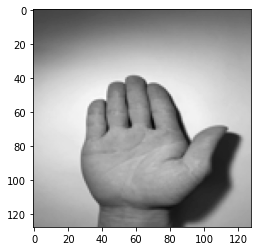

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは62番目の写真です


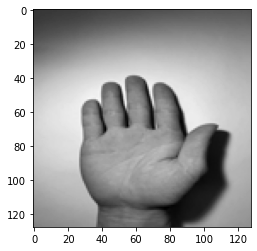

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは63番目の写真です


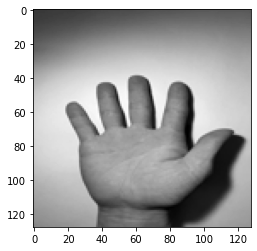

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは64番目の写真です


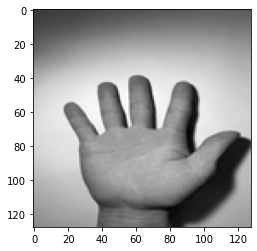

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは65番目の写真です


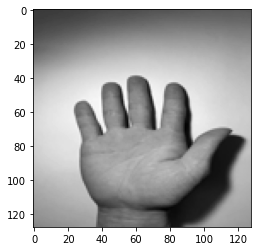

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは66番目の写真です


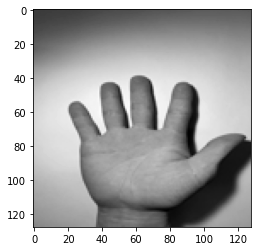

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは67番目の写真です


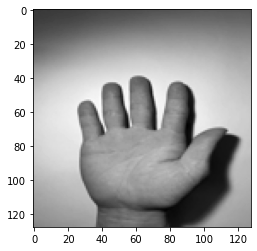

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは68番目の写真です


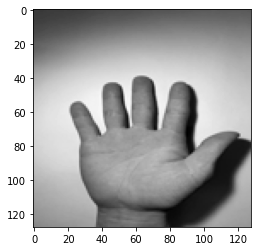

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは69番目の写真です


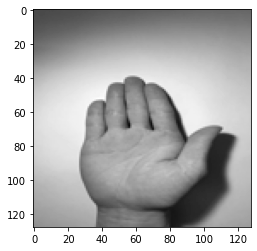

この写真は、 三村君の表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは0番目の写真です


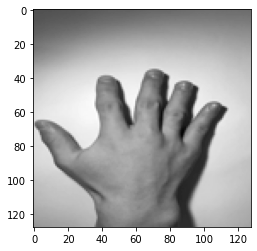

可能性が 84.40796732902527 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは1番目の写真です


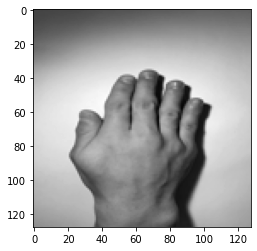

この写真は、 奥谷君の裏 です。
可能性は、 99.9840497970581 %です。

ここからは2番目の写真です


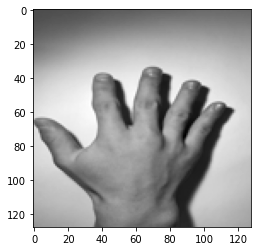

可能性が 85.39928793907166 %なので認証できません。
認証の結果は 石井さんの裏 でした。

ここからは3番目の写真です


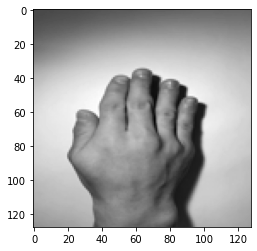

可能性が 77.230966091156 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは4番目の写真です


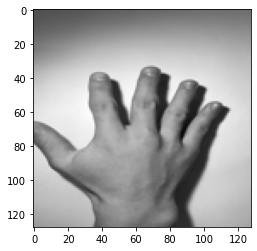

この写真は、 江波戸の表 です。
可能性は、 99.81443881988525 %です。

ここからは5番目の写真です


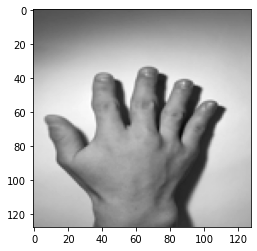

可能性が 95.95847129821777 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは6番目の写真です


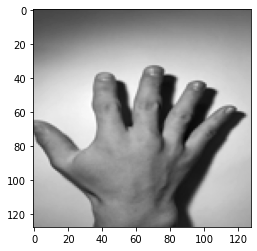

この写真は、 石井さんの裏 です。
可能性は、 99.91418123245239 %です。

ここからは7番目の写真です


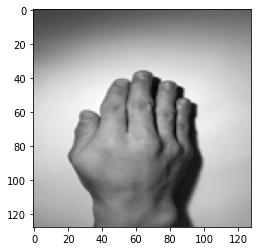

この写真は、 三村君の裏 です。
可能性は、 99.70769882202148 %です。

ここからは8番目の写真です


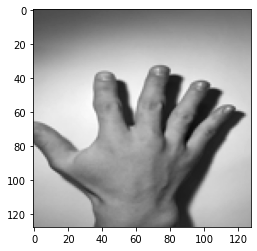

可能性が 98.31563830375671 %なので認証できません。
認証の結果は 石井さんの裏 でした。

ここからは9番目の写真です


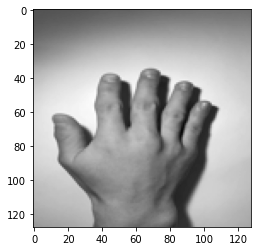

この写真は、 奥谷君の裏 です。
可能性は、 99.88574981689453 %です。
テスト対象の人が変わります

ここからは10番目の写真です


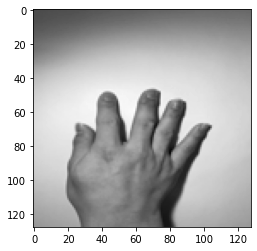

この写真は、 新井さんの表 です。
可能性は、 99.60046410560608 %です。

ここからは11番目の写真です


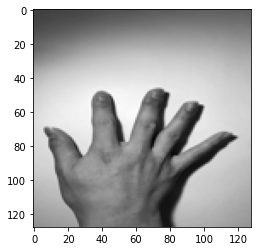

この写真は、 栃窪先生の表 です。
可能性は、 99.4045615196228 %です。

ここからは12番目の写真です


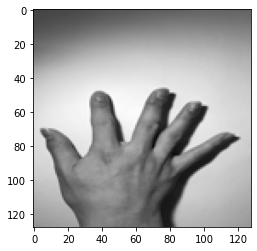

可能性が 94.34667229652405 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは13番目の写真です


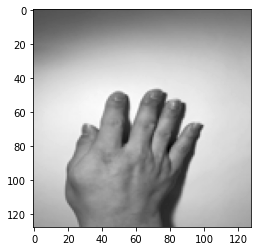

可能性が 87.91841268539429 %なので認証できません。
認証の結果は 栃窪先生の裏 でした。

ここからは14番目の写真です


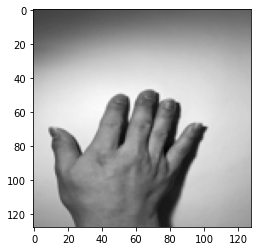

可能性が 96.30514979362488 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは15番目の写真です


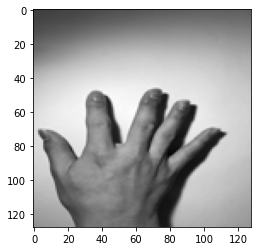

可能性が 59.55900549888611 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは16番目の写真です


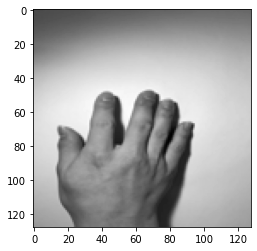

可能性が 74.90060925483704 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは17番目の写真です


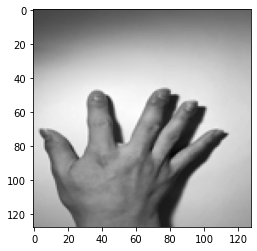

可能性が 94.98981833457947 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは18番目の写真です


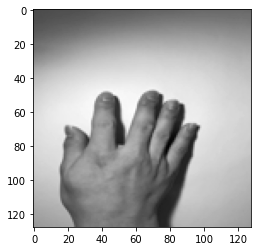

可能性が 59.63246822357178 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは19番目の写真です


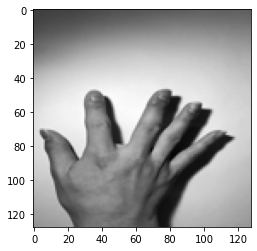

この写真は、 栃窪先生の表 です。
可能性は、 99.98705387115479 %です。
テスト対象の人が変わります

ここからは20番目の写真です


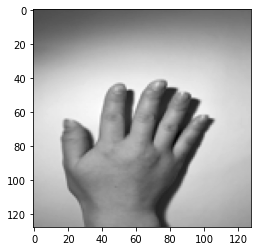

可能性が 68.22248697280884 %なので認証できません。
認証の結果は 栃窪先生の裏 でした。

ここからは21番目の写真です


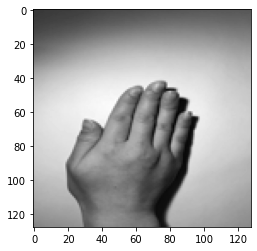

可能性が 72.96637296676636 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは22番目の写真です


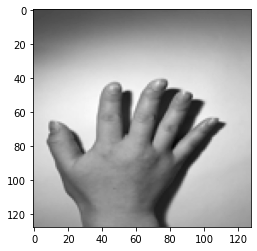

この写真は、 栃窪先生の裏 です。
可能性は、 99.99966621398926 %です。

ここからは23番目の写真です


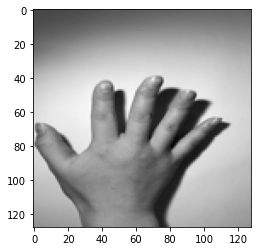

この写真は、 栃窪先生の裏 です。
可能性は、 100.0 %です。

ここからは24番目の写真です


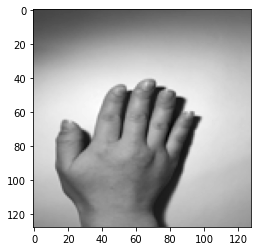

この写真は、 栃窪先生の裏 です。
可能性は、 99.99997615814209 %です。

ここからは25番目の写真です


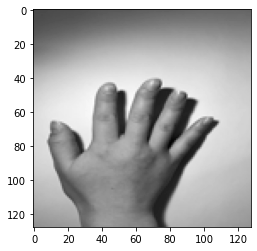

この写真は、 栃窪先生の裏 です。
可能性は、 99.99998807907104 %です。

ここからは26番目の写真です


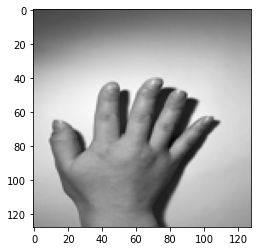

この写真は、 栃窪先生の裏 です。
可能性は、 99.99997615814209 %です。

ここからは27番目の写真です


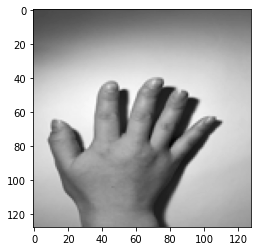

この写真は、 栃窪先生の裏 です。
可能性は、 99.99927282333374 %です。

ここからは28番目の写真です


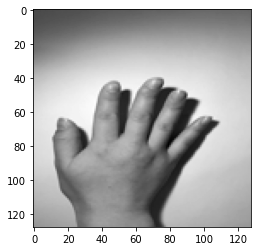

この写真は、 栃窪先生の裏 です。
可能性は、 99.99098777770996 %です。

ここからは29番目の写真です


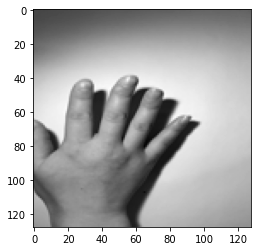

この写真は、 栃窪先生の表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは30番目の写真です


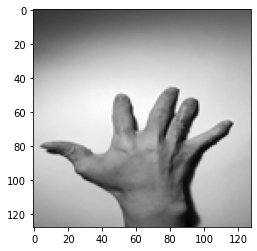

この写真は、 三村君の裏 です。
可能性は、 99.42657351493835 %です。

ここからは31番目の写真です


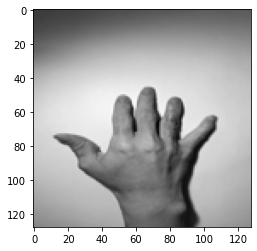

可能性が 75.07202625274658 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは32番目の写真です


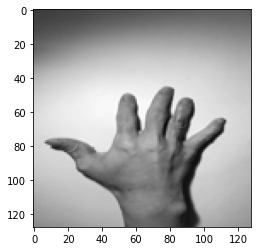

可能性が 90.47718048095703 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは33番目の写真です


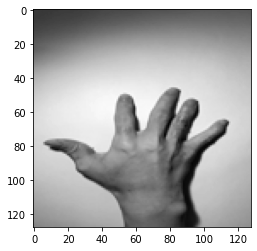

可能性が 98.26105237007141 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは34番目の写真です


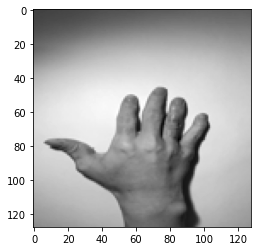

可能性が 91.66226387023926 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは35番目の写真です


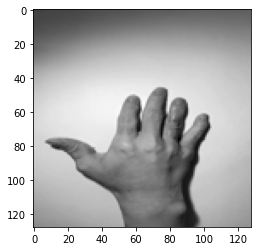

可能性が 97.53502607345581 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは36番目の写真です


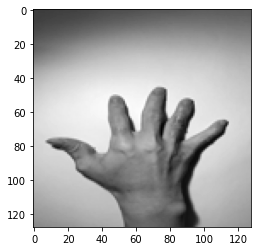

この写真は、 栃窪先生の裏 です。
可能性は、 99.3604838848114 %です。

ここからは37番目の写真です


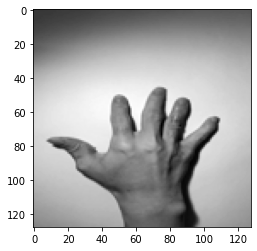

可能性が 80.43476343154907 %なので認証できません。
認証の結果は 栃窪先生の裏 でした。

ここからは38番目の写真です


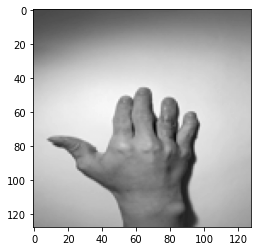

この写真は、 三村君の裏 です。
可能性は、 99.99350309371948 %です。

ここからは39番目の写真です


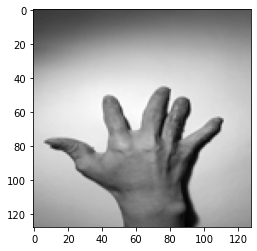

この写真は、 三村君の裏 です。
可能性は、 99.90930557250977 %です。
テスト対象の人が変わります

ここからは40番目の写真です


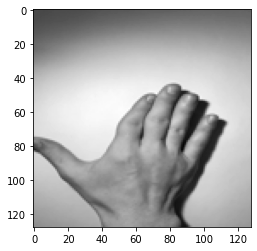

可能性が 86.90757155418396 %なので認証できません。
認証の結果は 石井さんの表 でした。

ここからは41番目の写真です


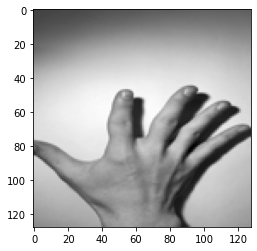

可能性が 93.7814474105835 %なので認証できません。
認証の結果は 石井さんの表 でした。

ここからは42番目の写真です


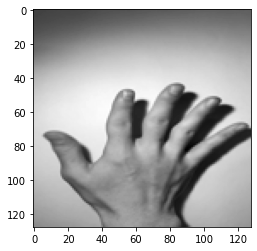

この写真は、 石井さんの表 です。
可能性は、 100.0 %です。

ここからは43番目の写真です


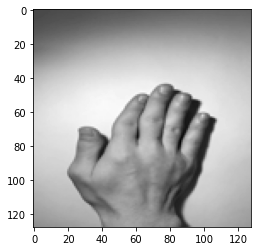

可能性が 71.30087614059448 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは44番目の写真です


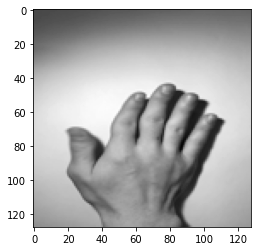

可能性が 58.37527513504028 %なので認証できません。
認証の結果は 石井さんの表 でした。

ここからは45番目の写真です


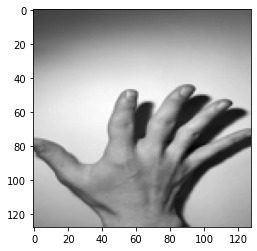

可能性が 96.88634872436523 %なので認証できません。
認証の結果は 石井さんの表 でした。

ここからは46番目の写真です


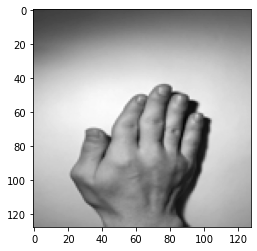

可能性が 64.5181953907013 %なので認証できません。
認証の結果は 栃窪先生の裏 でした。

ここからは47番目の写真です


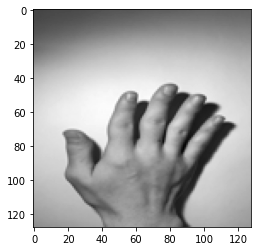

この写真は、 栃窪先生の裏 です。
可能性は、 99.70991611480713 %です。

ここからは48番目の写真です


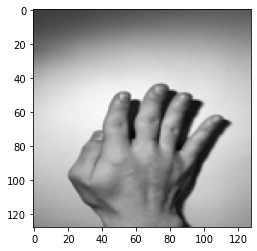

この写真は、 栃窪先生の裏 です。
可能性は、 99.99974966049194 %です。

ここからは49番目の写真です


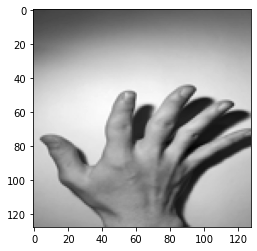

可能性が 98.47714304924011 %なので認証できません。
認証の結果は 石井さんの表 でした。
テスト対象の人が変わります

ここからは50番目の写真です


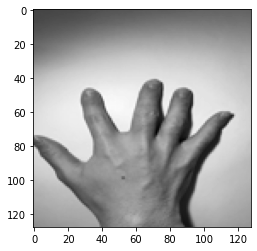

この写真は、 栃窪先生の裏 です。
可能性は、 99.99984502792358 %です。

ここからは51番目の写真です


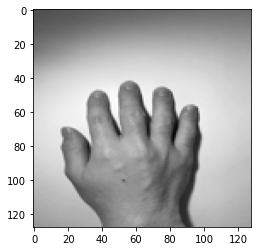

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは52番目の写真です


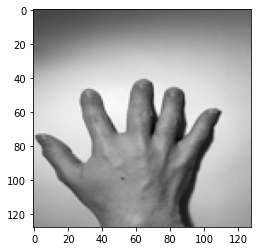

可能性が 75.71519017219543 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは53番目の写真です


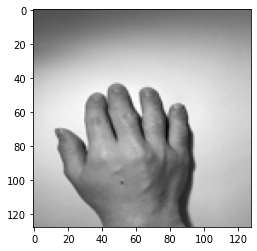

この写真は、 栃窪先生の表 です。
可能性は、 99.84264373779297 %です。

ここからは54番目の写真です


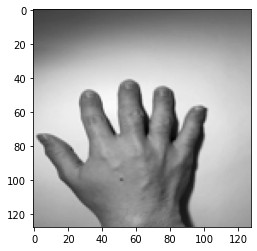

可能性が 96.3235080242157 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは55番目の写真です


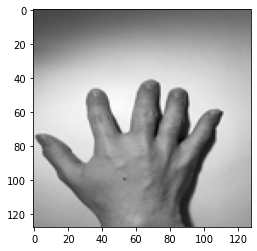

この写真は、 栃窪先生の裏 です。
可能性は、 100.0 %です。

ここからは56番目の写真です


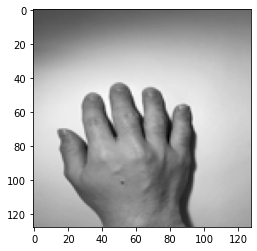

可能性が 86.80604696273804 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは57番目の写真です


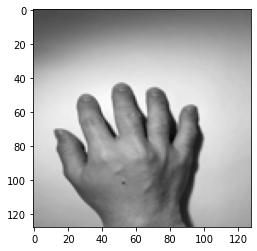

この写真は、 栃窪先生の表 です。
可能性は、 99.75231289863586 %です。

ここからは58番目の写真です


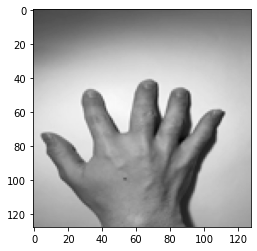

この写真は、 栃窪先生の裏 です。
可能性は、 99.66546297073364 %です。

ここからは59番目の写真です


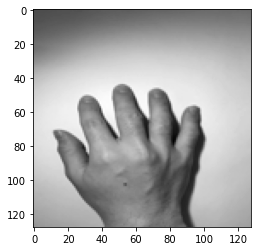

可能性が 97.0143735408783 %なので認証できません。
認証の結果は 栃窪先生の表 でした。
テスト対象の人が変わります

ここからは60番目の写真です


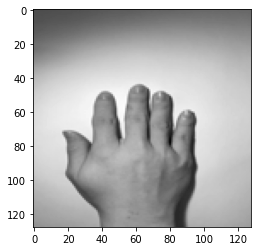

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは61番目の写真です


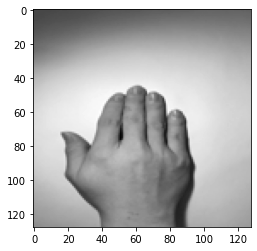

可能性が 78.52010130882263 %なので認証できません。
認証の結果は 栃窪先生の裏 でした。

ここからは62番目の写真です


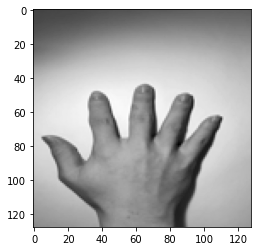

可能性が 93.71722340583801 %なので認証できません。
認証の結果は 栃窪先生の表 でした。

ここからは63番目の写真です


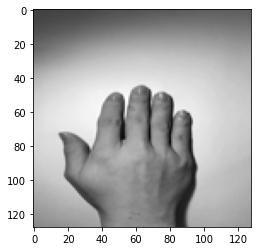

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは64番目の写真です


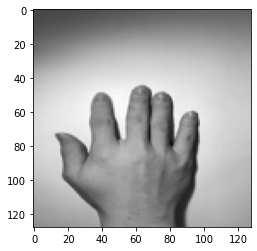

この写真は、 三村君の裏 です。
可能性は、 99.99998807907104 %です。

ここからは65番目の写真です


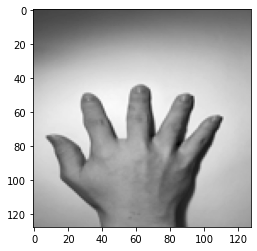

可能性が 98.95380735397339 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは66番目の写真です


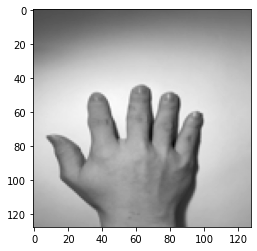

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは67番目の写真です


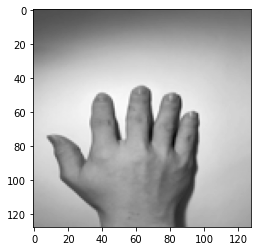

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは68番目の写真です


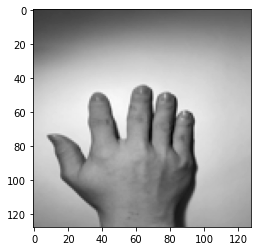

この写真は、 三村君の裏 です。
可能性は、 99.99998807907104 %です。

ここからは69番目の写真です


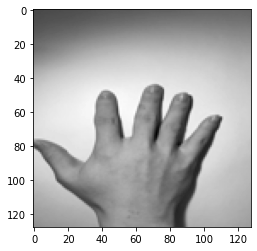

この写真は、 栃窪先生の裏 です。
可能性は、 99.99979734420776 %です。
テスト対象の人が変わります


In [9]:
#CNNモデルを用いた機械学習--(pro8)
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes, activation='softmax'))
    return model


def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model

#全員用の配列(本人受入率)
'''
omote=["arai/omote","gotou/omote","isii/omote",
       "mimura/omote","mine/omote","nakamura/omote",
       "okutani/omote","saitouhide/omote","saitouryou/omote",
       "sakuma/omote","tanaka/omote","tochikubo/omote",
       "tokuyama/omote","watanabe/omote",
       "yamaguchi/omote"]
ura=["arai/ura","gotou/ura","isii/ura",
       "mimura/ura","mine/ura","nakamura/ura",
       "okutani/ura","saitouhide/ura",
       "saitouryou/ura","sakuma/ura","tanaka/ura",
       "tochikubo/ura","tokuyama/ura","watanabe/ura",
       "yamaguchi/ura"]
'''

#他人受入率用のテスト配列
omote=["saitouhide/omote","saitouryou/omote",
      "sakuma/omote","tanaka/omote","tokuyama/omote","watanabe/omote",
      "yamaguchi/omote"]
ura=["saitouhide/ura","saitouryou/ura",
      "sakuma/ura","tanaka/ura","tokuyama/ura","watanabe/ura",
      "yamaguchi/ura"]
target_omote=[]
target_ura=[]
for k in range(7):#変更必要
    for i in range(10):
        target_omote.append("./graytest/"+str(omote[k])+"/"+str(i)+".jpg")#変更必要
        target_ura.append("./graytest/"+str(ura[k])+"/"+str(i)+".jpg")#変更必要

#target_omote="./test/3nensei/arai/omote/1.jpg"#変更必要
#target_ura="./test/3nensei/arai/ura/1.jpg"#変更必要

im_rows = 128 #変更必要
im_cols = 128 #変更必要
im_color = 1 #変更必要
in_shape = (im_rows, im_cols, im_color)
nb_classes = 16 #変更必要
#全員用のラベル(本人受入率)
'''
LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
        "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
        "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
        "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏",
        "斎藤ひであきさんの表","斎藤ひであきさんの裏","斎藤りょうがさんの表",
        "斎藤りょうがさんの裏","佐久間さんの表","佐久間さんの裏",
        "田中さんの表","田中さんの裏","徳山さんの表","徳山さんの裏",
        "渡邉さんの表","渡邉さんの裏","山口さんの表","山口さんの裏"]
      #  "関根さんの表","関根さんの裏","鳥海さんの表","鳥海さんの裏",
      #  "相澤さんの表","相澤さんの裏"]
'''
#他人受入率用のラベル
LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
       "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
       "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
       "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏"]

model = get_model(in_shape, nb_classes)
model.load_weights('./hdf/num16graylight128pix.hdf5')#変更必要

def check_photo(path):
    img=Image.open(path)
    #img=img.convert("RGB")
    img=img.resize((im_cols,im_rows))
    plt.imshow(img,cmap='gray')
    plt.show()

    x=np.asarray(img)
    x=x.reshape(-1,im_rows,im_cols,im_color)
    x=x/255
    
    #予測
    pre=model.predict([x])[0]#画像の予測
    idx=pre.argmax()
    per=(pre[idx]*100)
    #per=int(pre[idx]*100)
    return(idx,per)

def check_photo_str(path):
    idx,per=check_photo(path)
    if per>=99:
        print("この写真は、",LABELS[idx],"です。")
        print("可能性は、",per,"%です。")
    else:
        print('\033[31m'+"可能性が",per,"%なので認証できません。"+'\033[31m')
        print("認証の結果は",LABELS[idx],"でした。")
    
if __name__=='__main__':
    number=[9,19,29,39,49,59,69,79,89,99,109,119,129,139,149]
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_omote[i])
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_ura[i])
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")

In [51]:
#テスト画像をグレースケールに変換
import cv2
import os

output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","saitouhide/omote","saitouhide/ura","saitouryou/omote",
       "saitouryou/ura","sakuma/omote","sakuma/ura","tanaka/omote","tanaka/ura","tochikubo/omote",
       "tochikubo/ura","tokuyama/omote","tokuyama/ura","watanabe/omote","watanabe/ura",
       "yamaguchi/omote","yamaguchi/ura"]
for i in range(30):
    save_dir="./edgestest/"+str(output[i])
    for k in range(10):
        img=cv2.imread("./test/"+str(output[i])+"/"+str(k)+".jpg")
        outfile=save_dir+"/"+str(k)+".jpg"
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.GaussianBlur(img_gray, (3, 3), 3)
        edges = cv2.Laplacian(img, cv2.CV_64F)
        cv2.imwrite(outfile, edges)
        
    print(str(output[i])+":ok")

arai/omote:ok
arai/ura:ok
gotou/omote:ok
gotou/ura:ok
isii/omote:ok
isii/ura:ok
mimura/omote:ok
mimura/ura:ok
mine/omote:ok
mine/ura:ok
nakamura/omote:ok
nakamura/ura:ok
okutani/omote:ok
okutani/ura:ok
saitouhide/omote:ok
saitouhide/ura:ok
saitouryou/omote:ok
saitouryou/ura:ok
sakuma/omote:ok
sakuma/ura:ok
tanaka/omote:ok
tanaka/ura:ok
tochikubo/omote:ok
tochikubo/ura:ok
tokuyama/omote:ok
tokuyama/ura:ok
watanabe/omote:ok
watanabe/ura:ok
yamaguchi/omote:ok
yamaguchi/ura:ok



ここからは0番目の写真です


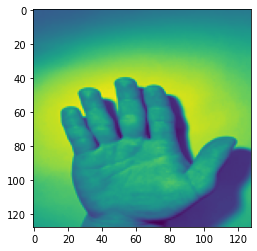

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは1番目の写真です


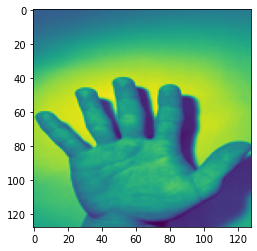

可能性が 97 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは2番目の写真です


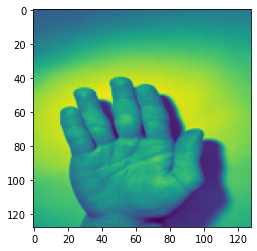

可能性が 97 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは3番目の写真です


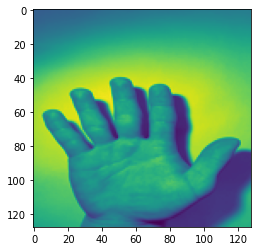

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは4番目の写真です


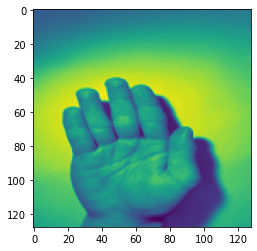

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは5番目の写真です


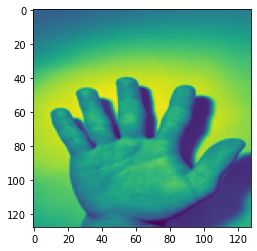

可能性が 94 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは6番目の写真です


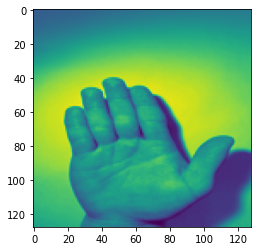

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは7番目の写真です


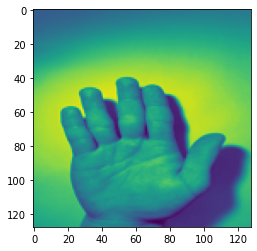

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは8番目の写真です


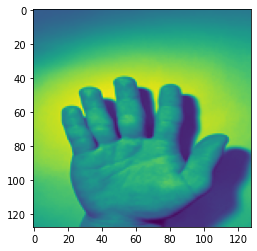

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは9番目の写真です


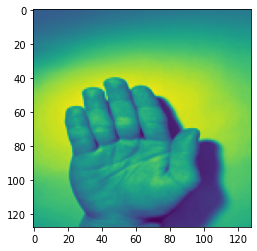

この写真は、 新井さんの表 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは10番目の写真です


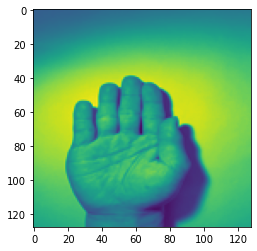

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは11番目の写真です


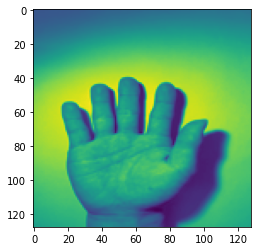

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは12番目の写真です


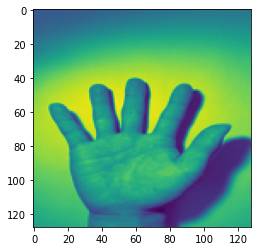

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは13番目の写真です


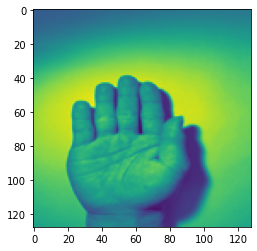

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは14番目の写真です


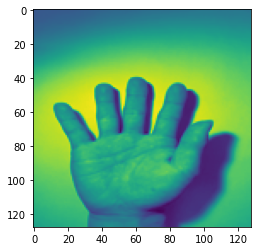

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは15番目の写真です


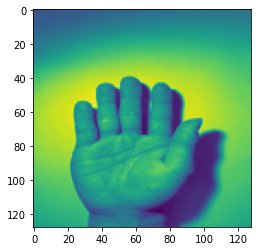

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは16番目の写真です


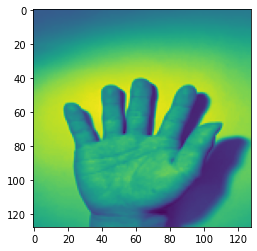

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは17番目の写真です


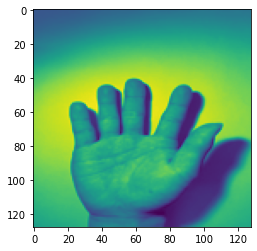

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは18番目の写真です


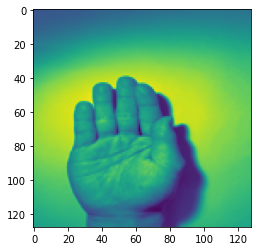

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは19番目の写真です


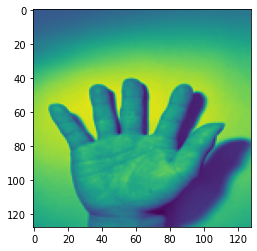

この写真は、 新井さんの表 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは20番目の写真です


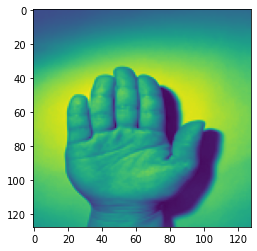

可能性が 96 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは21番目の写真です


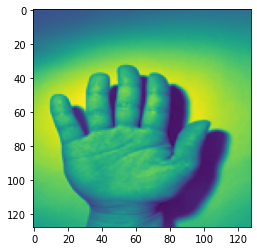

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは22番目の写真です


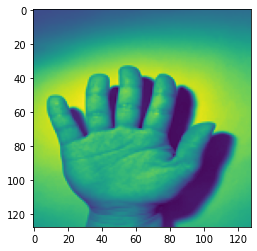

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは23番目の写真です


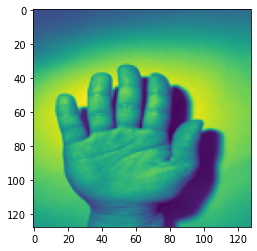

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは24番目の写真です


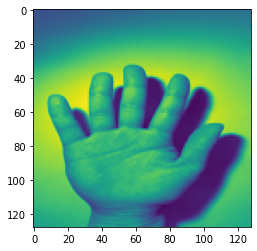

可能性が 95 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは25番目の写真です


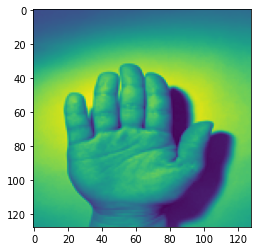

可能性が 97 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは26番目の写真です


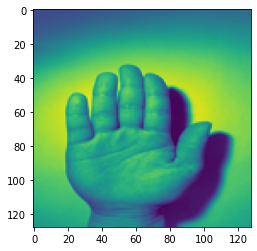

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは27番目の写真です


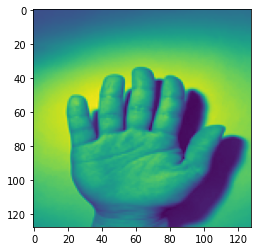

可能性が 82 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは28番目の写真です


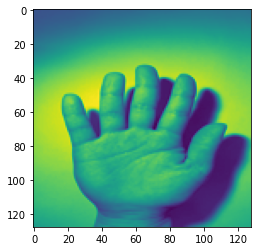

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは29番目の写真です


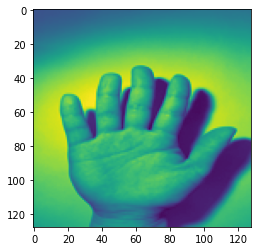

可能性が 95 %なので認証できません。
認証の結果は 三村君の表 でした。
テスト対象の人が変わります

ここからは30番目の写真です


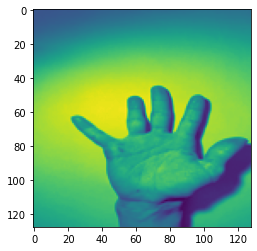

可能性が 88 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは31番目の写真です


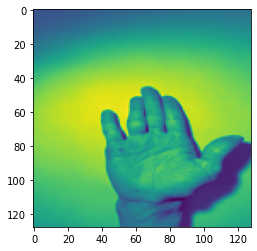

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは32番目の写真です


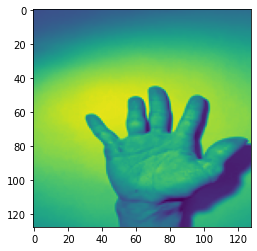

可能性が 91 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは33番目の写真です


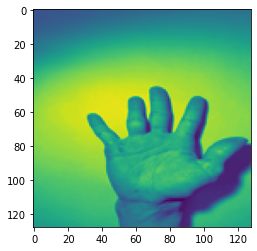

可能性が 92 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは34番目の写真です


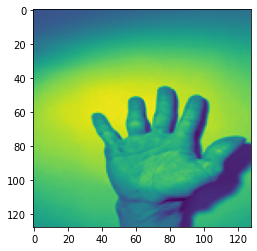

可能性が 65 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは35番目の写真です


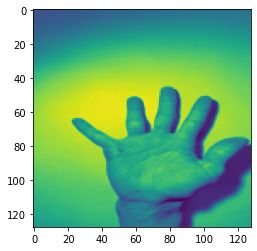

可能性が 80 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは36番目の写真です


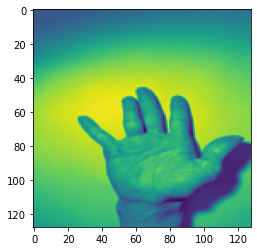

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは37番目の写真です


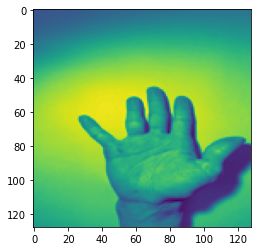

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは38番目の写真です


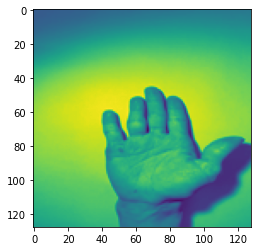

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは39番目の写真です


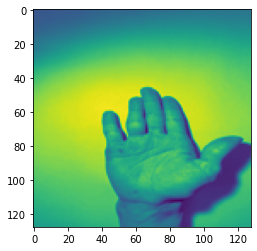

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。
テスト対象の人が変わります

ここからは40番目の写真です


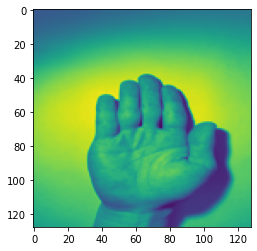

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは41番目の写真です


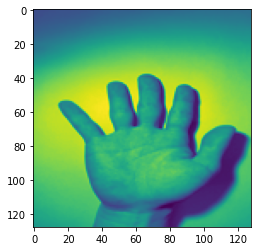

この写真は、 三村君の表 です。
可能性は、 100 %です。

ここからは42番目の写真です


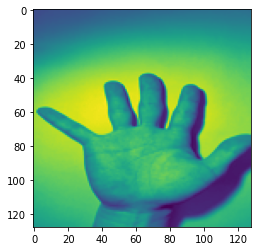

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは43番目の写真です


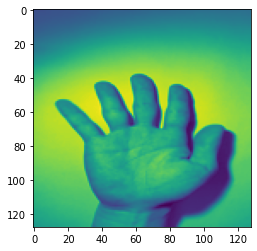

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは44番目の写真です


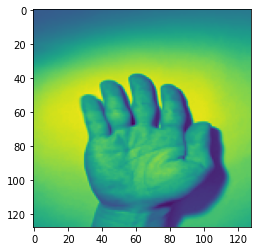

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは45番目の写真です


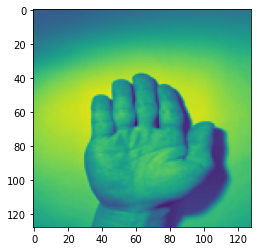

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは46番目の写真です


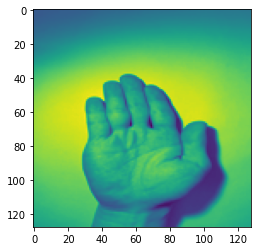

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは47番目の写真です


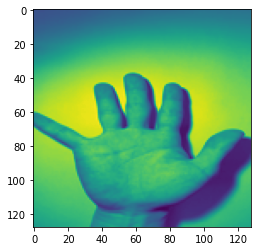

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは48番目の写真です


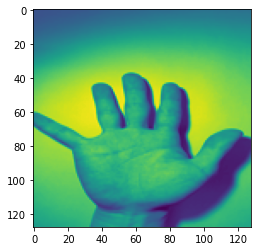

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは49番目の写真です


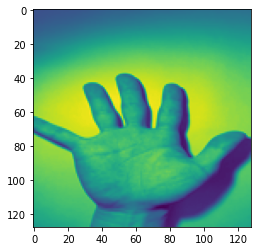

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。
テスト対象の人が変わります

ここからは50番目の写真です


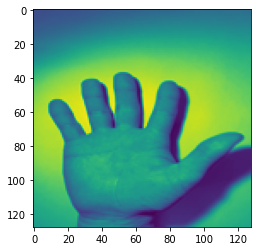

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは51番目の写真です


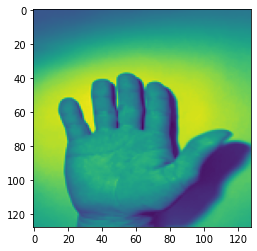

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは52番目の写真です


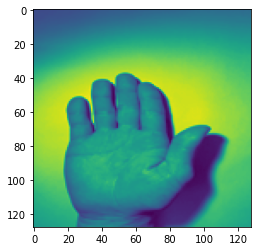

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは53番目の写真です


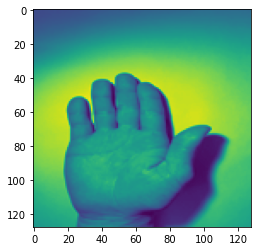

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは54番目の写真です


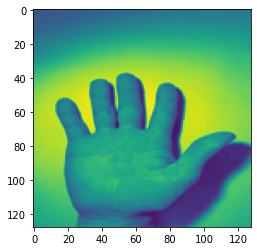

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは55番目の写真です


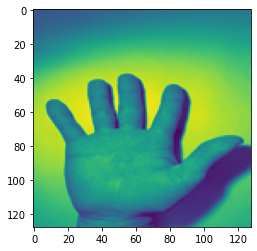

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは56番目の写真です


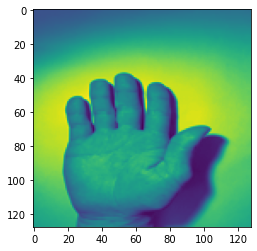

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは57番目の写真です


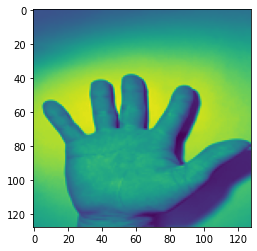

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは58番目の写真です


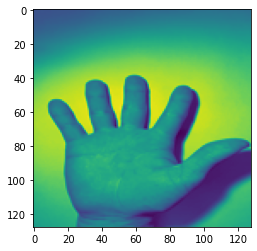

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは59番目の写真です


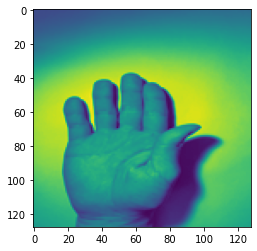

この写真は、 新井さんの表 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは60番目の写真です


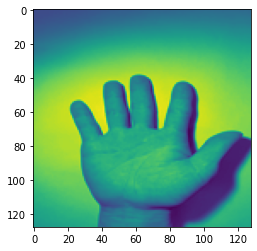

可能性が 53 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは61番目の写真です


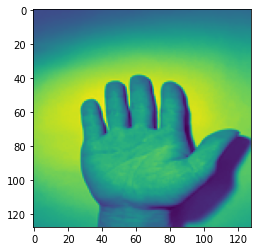

可能性が 61 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは62番目の写真です


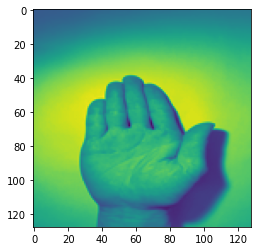

可能性が 98 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは63番目の写真です


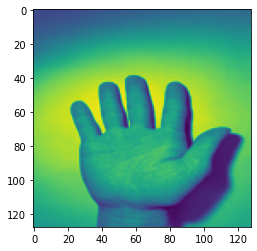

可能性が 86 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは64番目の写真です


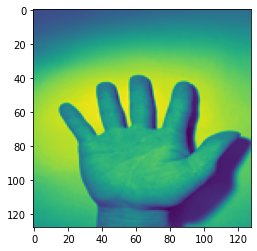

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは65番目の写真です


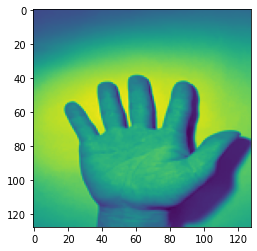

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは66番目の写真です


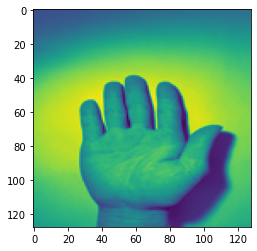

可能性が 84 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは67番目の写真です


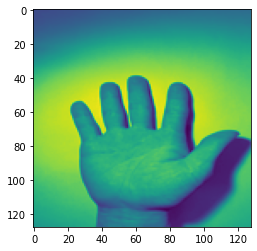

可能性が 92 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは68番目の写真です


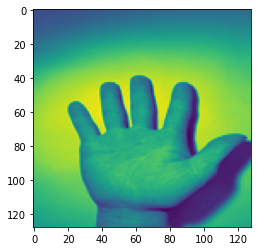

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは69番目の写真です


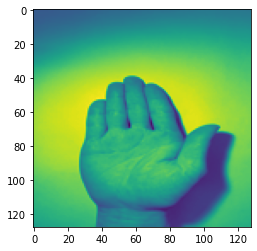

可能性が 95 %なので認証できません。
認証の結果は 三村君の表 でした。
テスト対象の人が変わります

ここからは0番目の写真です


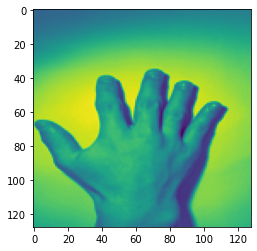

可能性が 94 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは1番目の写真です


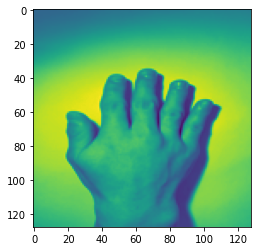

可能性が 98 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは2番目の写真です


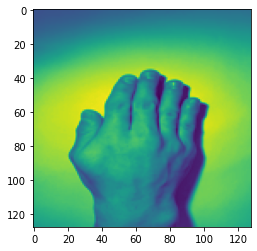

可能性が 89 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは3番目の写真です


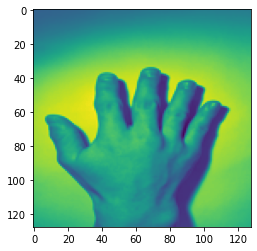

この写真は、 奥谷君の裏 です。
可能性は、 99 %です。

ここからは4番目の写真です


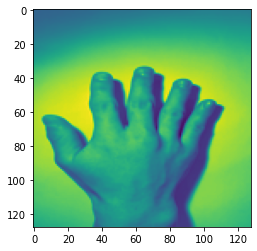

可能性が 41 %なので認証できません。
認証の結果は 江波戸の裏 でした。

ここからは5番目の写真です


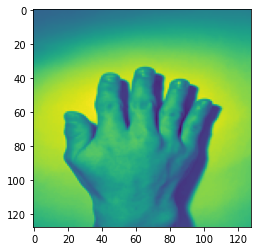

可能性が 85 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは6番目の写真です


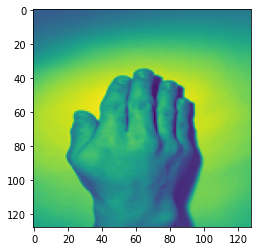

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは7番目の写真です


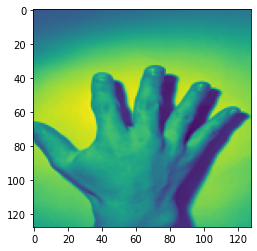

可能性が 60 %なので認証できません。
認証の結果は 石井さんの裏 でした。

ここからは8番目の写真です


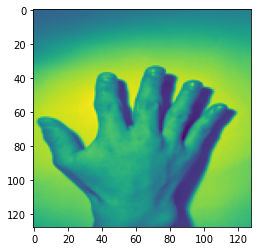

可能性が 88 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは9番目の写真です


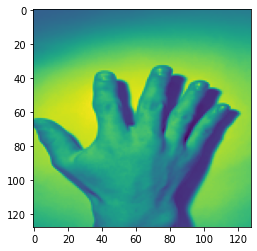

可能性が 77 %なので認証できません。
認証の結果は 奥谷君の裏 でした。
テスト対象の人が変わります

ここからは10番目の写真です


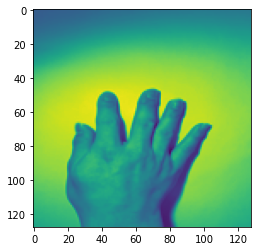

可能性が 89 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは11番目の写真です


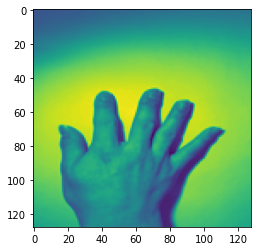

可能性が 60 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは12番目の写真です


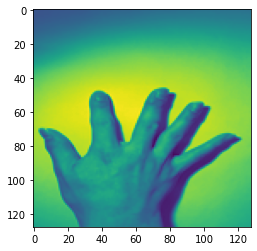

可能性が 90 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは13番目の写真です


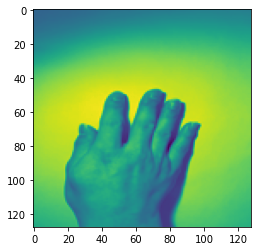

可能性が 97 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは14番目の写真です


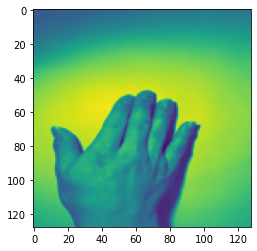

可能性が 95 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは15番目の写真です


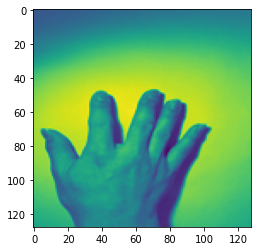

可能性が 85 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは16番目の写真です


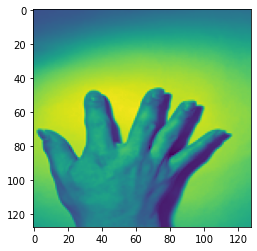

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは17番目の写真です


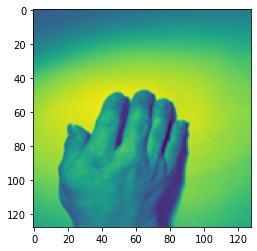

この写真は、 新井さんの裏 です。
可能性は、 99 %です。

ここからは18番目の写真です


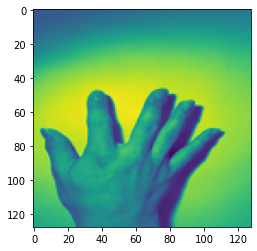

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは19番目の写真です


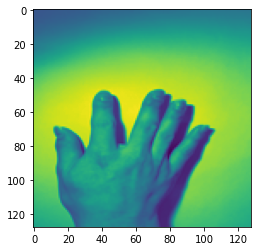

この写真は、 三村君の裏 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは20番目の写真です


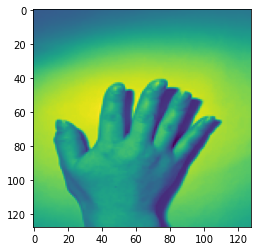

可能性が 97 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは21番目の写真です


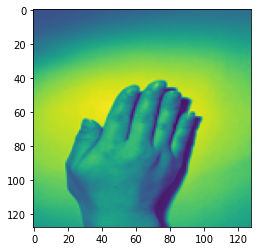

可能性が 85 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは22番目の写真です


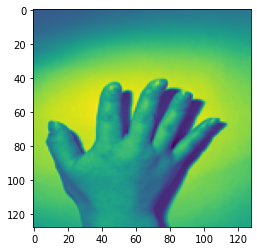

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは23番目の写真です


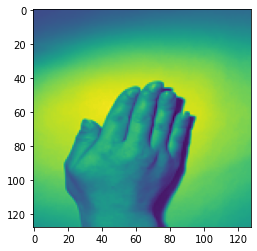

可能性が 83 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは24番目の写真です


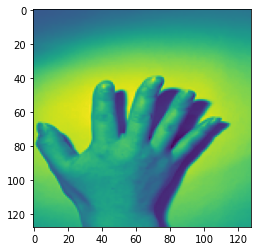

可能性が 79 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは25番目の写真です


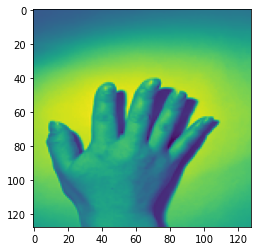

可能性が 71 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは26番目の写真です


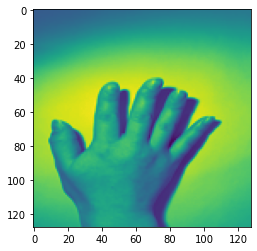

可能性が 88 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは27番目の写真です


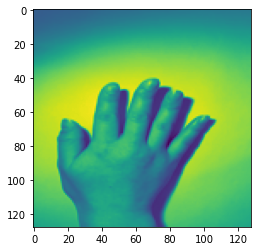

可能性が 77 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは28番目の写真です


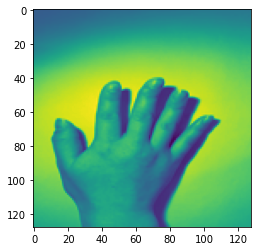

可能性が 91 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは29番目の写真です


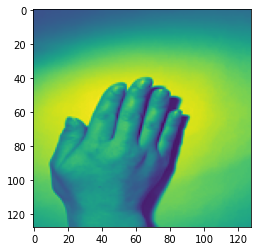

可能性が 55 %なので認証できません。
認証の結果は 新井さんの裏 でした。
テスト対象の人が変わります

ここからは30番目の写真です


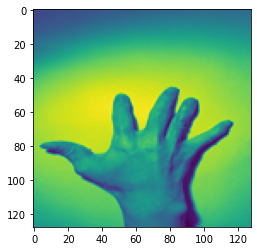

可能性が 90 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは31番目の写真です


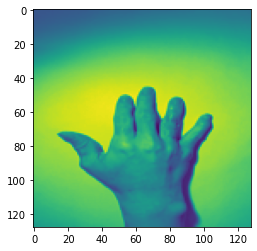

可能性が 71 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは32番目の写真です


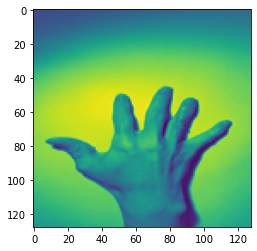

可能性が 98 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは33番目の写真です


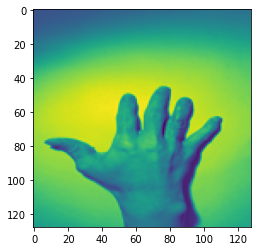

可能性が 98 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは34番目の写真です


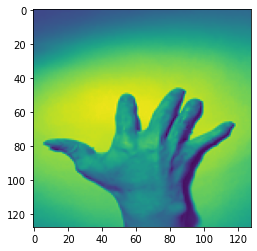

可能性が 72 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは35番目の写真です


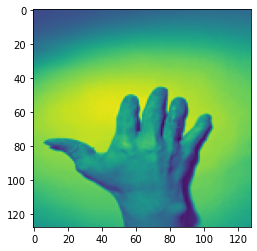

可能性が 97 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは36番目の写真です


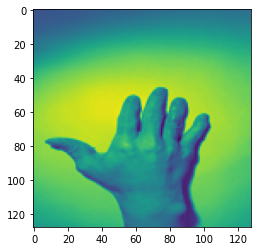

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは37番目の写真です


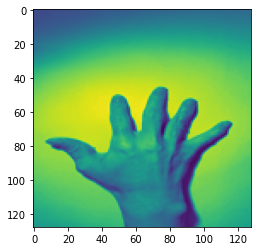

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは38番目の写真です


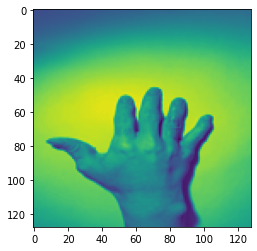

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは39番目の写真です


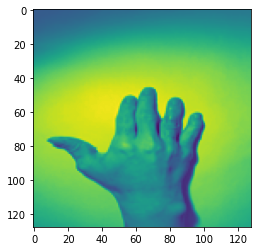

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。
テスト対象の人が変わります

ここからは40番目の写真です


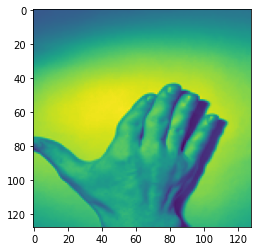

可能性が 89 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは41番目の写真です


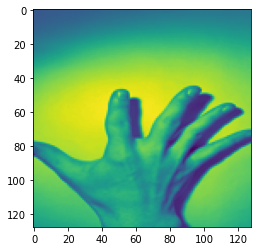

可能性が 98 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは42番目の写真です


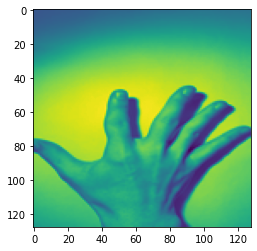

可能性が 98 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは43番目の写真です


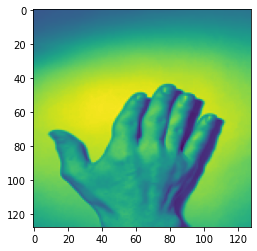

可能性が 65 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは44番目の写真です


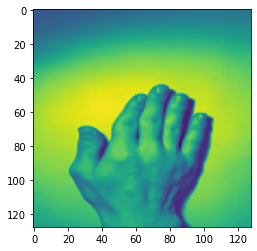

可能性が 52 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは45番目の写真です


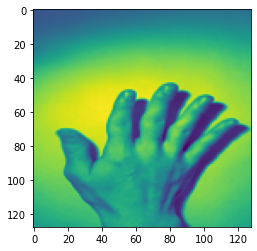

可能性が 87 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは46番目の写真です


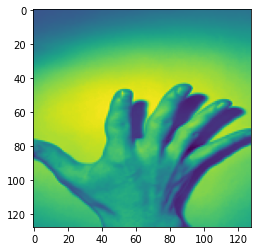

この写真は、 新井さんの裏 です。
可能性は、 99 %です。

ここからは47番目の写真です


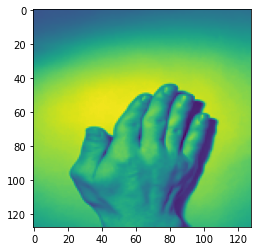

可能性が 90 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは48番目の写真です


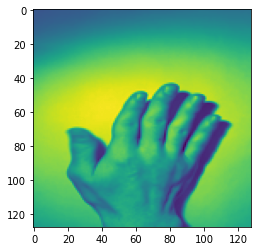

可能性が 91 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは49番目の写真です


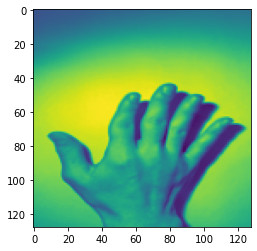

可能性が 89 %なので認証できません。
認証の結果は 新井さんの裏 でした。
テスト対象の人が変わります

ここからは50番目の写真です


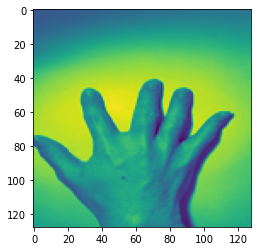

可能性が 96 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは51番目の写真です


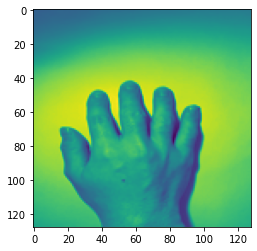

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは52番目の写真です


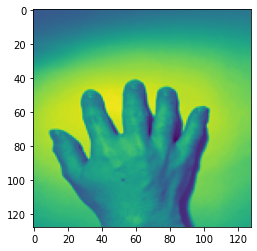

可能性が 89 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは53番目の写真です


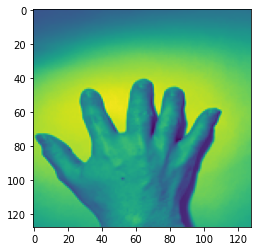

可能性が 76 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは54番目の写真です


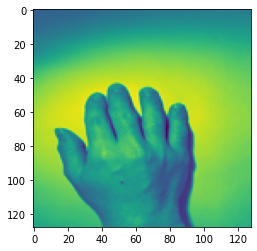

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは55番目の写真です


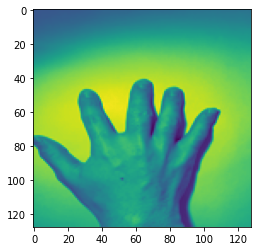

可能性が 90 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは56番目の写真です


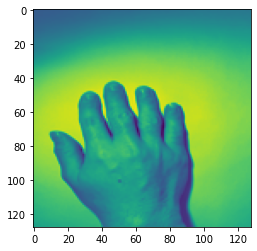

この写真は、 新井さんの裏 です。
可能性は、 99 %です。

ここからは57番目の写真です


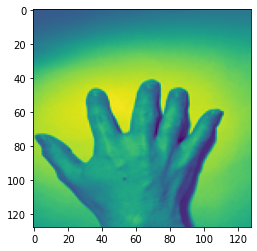

可能性が 58 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは58番目の写真です


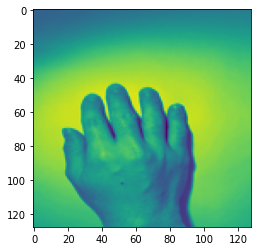

可能性が 97 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは59番目の写真です


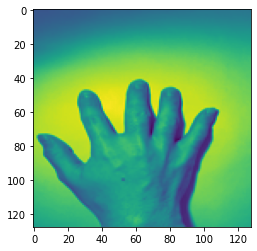

可能性が 64 %なので認証できません。
認証の結果は 新井さんの裏 でした。
テスト対象の人が変わります

ここからは60番目の写真です


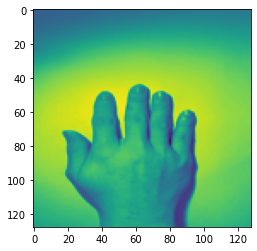

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは61番目の写真です


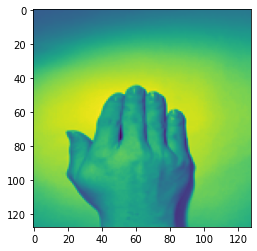

可能性が 92 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは62番目の写真です


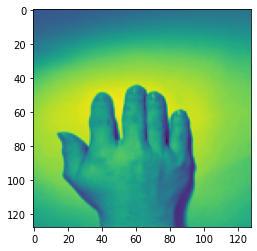

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは63番目の写真です


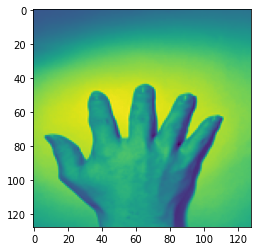

可能性が 95 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは64番目の写真です


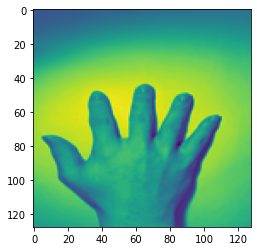

可能性が 95 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは65番目の写真です


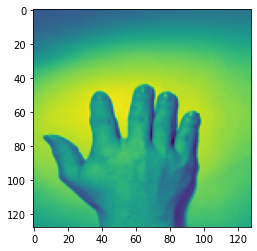

可能性が 98 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは66番目の写真です


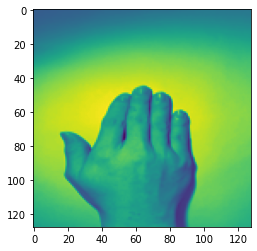

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは67番目の写真です


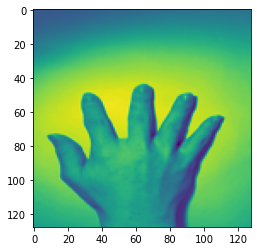

可能性が 90 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは68番目の写真です


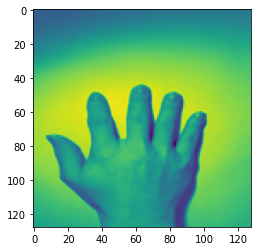

可能性が 85 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは69番目の写真です


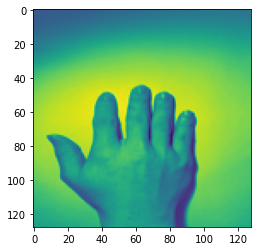

この写真は、 三村君の裏 です。
可能性は、 99 %です。
テスト対象の人が変わります


In [74]:
#他人受入率の評価
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,#畳み込み
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))#畳み込み
    model.add(MaxPooling2D(pool_size=(2, 2)))#プーリング
    model.add(Dropout(0.25))#ドロップアウト

    model.add(Conv2D(64, (3, 3), activation='relu'))#畳み込み
    model.add(Conv2D(64, (3, 3), activation='relu'))#畳み込み
    model.add(MaxPooling2D(pool_size=(2, 2)))#プーリング
    model.add(Dropout(0.25))#ドロップアウト

    model.add(Flatten())#平滑化
    model.add(Dense(512, activation='relu'))#畳み込み
    model.add(Dropout(0.5))#ドロップアウト
    model.add(Dense(nb_classes, activation='softmax'))#畳み込み
    return model


def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model
omote=["saitouhide/omote","saitouryou/omote",
       "sakuma/omote","tanaka/omote",
       "tokuyama/omote","watanabe/omote",
       "yamaguchi/omote"]
ura=["saitouhide/ura","saitouryou/ura",
     "sakuma/ura","tanaka/ura",
       "tokuyama/ura","watanabe/ura",
       "yamaguchi/ura"]
target_omote=[]
target_ura=[]
for k in range(7):#変更必要
    for i in range(10):
        target_omote.append("./graytest/"+str(omote[k])+"/"+str(i)+".jpg")#変更必要
        target_ura.append("./graytest/"+str(ura[k])+"/"+str(i)+".jpg")#変更必要

#target_omote="./test/3nensei/arai/omote/1.jpg"#変更必要
#target_ura="./test/3nensei/arai/ura/1.jpg"#変更必要

im_rows = 128 #変更必要
im_cols = 128 #変更必要
im_color = 1  #変更必要RGBなら３
in_shape = (im_rows, im_cols, im_color)
nb_classes = 16 #変更必要

LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
        "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
        "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
        "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏"]

model = get_model(in_shape, nb_classes)
model.load_weights('./hdf/num16graylight128pix.hdf5')#変更必要

def check_photo(path):
    img=Image.open(path)
    #img=img.convert("RGB")
    img=img.resize((im_cols,im_rows))
    plt.imshow(img)
    plt.show()

    x=np.asarray(img)
    x=x.reshape(-1,im_rows,im_cols,im_color)
    x=x/255
    
    #予測
    pre=model.predict([x])[0]
    idx=pre.argmax()
    per=int(pre[idx]*100)
    return(idx,per)

def check_photo_str(path):
    idx,per=check_photo(path)
    if per>=99:
        print("この写真は、",LABELS[idx],"です。")
        print("可能性は、",per,"%です。")
    else:
        print('\033[31m'+"可能性が",per,"%なので認証できません。")
        print("認証の結果は",LABELS[idx],"でした。")
    
if __name__=='__main__':
    number=[9,19,29,39,49,59,69,79,89,99,109,119,129,139,149]
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_omote[i])
        #numberの中身の数字と比較
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_ura[i])
        #numberの中身の数字と比較
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")

-------------------------------------------------------
画像の中身
[[[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [100 105 104]
  [100 105 104]
  [100 105 104]]

 [[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [100 105 104]
  [ 99 104 103]
  [ 99 104 103]]

 [[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [ 99 104 103]
  [ 98 103 102]
  [ 97 102 101]]

 ...

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [148 152 153]
  [147 151 152]
  [147 151 152]]

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [148 152 153]
  [147 151 152]
  [147 151 152]]

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [147 151 152]
  [147 151 152]
  [147 151 152]]]
-------------------------------------------------------
解像度
(1080, 1920)
-------------------------------------------------------
画像のモード
RGB
-------------------------------------------------------
画像の中身
[[ 80  80  80 ... 104 104 104]
 [ 80  80  80 ... 104 103 103]
 [ 80  80  80 ... 103 102 101]
 ...
 [143 14

<function matplotlib.pyplot.show(close=None, block=None)>

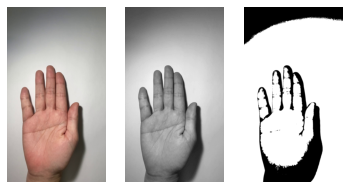

In [18]:
#画像の内部構造を知るためのプログラム
import cv2
import os 
import matplotlib.pyplot as plt
from PIL import Image


img=cv2.imread("./test/arai/omote/0.jpg")
image = Image.open('./test/arai/omote/0.jpg')
#plt.subplot(1,2,1)
print("-------------------------------------------------------")
print("画像の中身")
print(img)
print("-------------------------------------------------------")
print("解像度")
print(image.size)
print("-------------------------------------------------------")
print("画像のモード")
#RGBの場合3x8 bit/pixel カラー画像
print(image.mode)
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show

#グレイスケールの場合
image2 = Image.open('./graytest/arai/omote/0.jpg')
img2=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print("-------------------------------------------------------")
print("画像の中身")
print(img2)
print("-------------------------------------------------------")
print("解像度")
print(image2.size)
print("-------------------------------------------------------")
print("画像のモード")
print(image2.mode)
#Lの場合8 bit/pixel 白黒画像
plt.gray()
plt.subplot(1,3,2)
plt.imshow(img2)
plt.axis("off")
plt.show


#バイナリ値の場合
#img3 = cv2.imread('./graytest/arai/omote/0.jpg')
ret, bi_img = cv2.threshold(img2, 127, 255, cv2.THRESH_BINARY)#1つ目の戻り値が閾値、2つ目が画像
cv2.imwrite("./binary.jpg" , bi_img)#binaryでバイナリ画像に変換
image3 = Image.open("./binary.jpg")
print("-------------------------------------------------------")
print("画像の中身")
print(bi_img)
print("-------------------------------------------------------")
print("解像度")
print(image3.size)
print("-------------------------------------------------------")
print("画像のモード")
print(image3.mode)
print(image3)
#Lの場合8 bit/pixel 白黒画像
plt.gray()
plt.subplot(1,3,3)
plt.imshow(bi_img)
plt.axis("off")
plt.show


In [37]:
#バイナリ用のプログラム
import cv2
import os
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura","saitouhideakiomote",
      "saitouhideakiura","saitouryougaomote","saitouryougaura","sakumaomote","sakumaura",
      "tanakaomote","tanakaura","tochiomote","tochiura","tokuyamaomote","tokuyamaura",
      "watanabeomote","watanabeura","yamaguchiomote","yamaguchiura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","saitouhide/omote","saitouhide/ura","saitouryou/omote",
       "saitouryou/ura","sakuma/omote","sakuma/ura","tanaka/omote","tanaka/ura","tochikubo/omote",
       "tochikubo/ura","tokuyama/omote","tokuyama/ura","watanabe/omote","watanabe/ura",
       "yamaguchi/omote","yamaguchi/ura"]
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura"]

for i in range(14):#変更必要
    save_dir="./binaryhands/"+str(output[i])
    cap=cv2.VideoCapture("./MOV/"+str(inputname[i])+".MOV")
    if not cap.isOpened():
        sys.exit()
    n= 0
    while True:
        # read()でフレーム画像が読み込めたかを示すbool、フレーム画像の配列ndarrayのタプル
        is_image,frame_img = cap.read()
        if is_image:
            # 画像を保存
            outfile=save_dir+"/"+str(n)+".jpg"
            im_gray = cv2.cvtColor(frame_img, cv2.COLOR_BGR2GRAY)
            ret, bi_img = cv2.threshold(im_gray, 127, 255, cv2.THRESH_BINARY)
            cv2.imwrite(outfile, bi_img)#binaryでバイナリ画像に変換
        else:
            # フレーム画像が読込なかったら終了
            break
        n += 1

    cap.release()
    print(str(output[i])+":ok")

arai/omote:ok
arai/ura:ok
gotou/omote:ok
gotou/ura:ok
isii/omote:ok
isii/ura:ok
mimura/omote:ok
mimura/ura:ok
mine/omote:ok
mine/ura:ok
nakamura/omote:ok
nakamura/ura:ok
okutani/omote:ok
okutani/ura:ok


In [19]:
#バイナリ用のnumpy保存プログラム
import numpy as np
from PIL import Image
import cv2
import os,glob,random

outfile="./num14binarylight128.npz"#変更必要
max_photo=40000
photo_size=128#変更必要
x=[]
y=[]

def main():
    glob_files("./binaryhands/mine/omote",0)
    glob_files("./binaryhands/mine/ura",1)
    glob_files("./binaryhands/okutani/omote",2)
    glob_files("./binaryhands/okutani/ura",3)
    #glob_files("./hands/tochikubo/omote",4)
    #glob_files("./hands/tochikubo/ura",5)
    glob_files("./binaryhands/nakamura/omote",4)
    glob_files("./binaryhands/nakamura/ura",5)
    glob_files("./binaryhands/gotou/omote",6)
    glob_files("./binaryhands/gotou/ura",7)
    glob_files("./binaryhands/mimura/omote",8)
    glob_files("./binaryhands/mimura/ura",9)
    glob_files("./binaryhands/arai/omote",10)
    glob_files("./binaryhands/arai/ura",11)
    glob_files("./binaryhands/isii/omote",12)
    glob_files("./binaryhands/isii/ura",13)
    #glob_files("./hands/saitouhide/omote",16)
    #glob_files("./hands/saitouhide/ura",17)
    #glob_files("./hands/saitouryou/omote",18)
    #glob_files("./hands/saitouryou/ura",19)
    #glob_files("./hands/sakuma/omote",20)
    #glob_files("./hands/sakuma/ura",21)
    #glob_files("./hands/tanaka/omote",22)
    #glob_files("./hands/tanaka/ura",23)
    #glob_files("./hands/tokuyama/omote",24)
    #glob_files("./hands/tokuyama/ura",25)
    #glob_files("./hands/watanabe/omote",26)
    #glob_files("./hands/watanabe/ura",27)
    #glob_files("./hands/yamaguchi/omote",28)
    #glob_files("./hands/yamaguchi/ura",29)
    #glob_files("./hands/sekine/omote",30)
    #glob_files("./hands/sekine/ura",31)
    #glob_files("./hands/toriumi/omote",32)
    #glob_files("./hands/toriumi/ura",33)
    #glob_files("./hands/aizawa/omote",34)
    #glob_files("./hands/aizawa/ura",35)
    np.savez(outfile,x=x,y=y)
    print("保存しました:"+outfile,len(x))
    print(x[0],y[0])
    
def glob_files(path,label):
    files=glob.glob(path+"/*.jpg")
    random.shuffle(files)
    num=0
    for f in files:
        if num>=max_photo: break
        num+=1
        #img=Image.open(f)#RGBのコード
        #img=img.resize((photo_size,photo_size))
        
        #---------Grayscaleの時のプログラム--------------
        img=cv2.imread(f)
        img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, bi_img = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
        bi_img=cv2.resize(bi_img,(photo_size,photo_size))
        
        
        bi_img=np.asarray(bi_img)#1つの配列に格納（この場合2つ）
        x.append(bi_img)
        y.append(label)
if __name__=='__main__':
    main()

保存しました:./num14binarylight128.npz 3051
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]] 0


[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
[[255 255 255 ... 255 255 255]
 [255   0 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


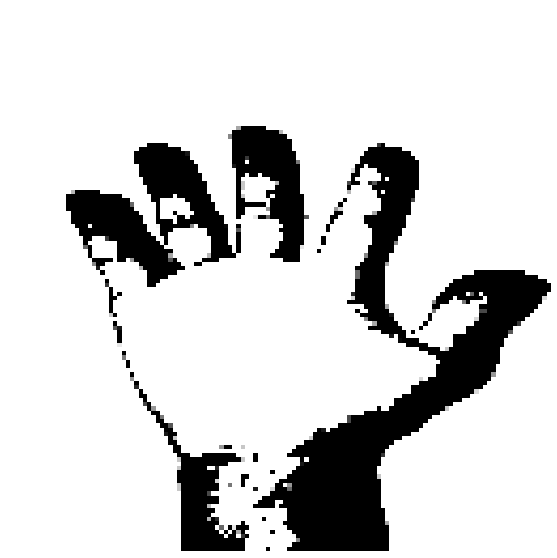

In [11]:
#バイナリファイルの中身を確認するプログラム
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
#写真データ読み込み
photos=np.load('./num14binarylight128.npz')
x=photos['x']
y=photos['y']
#開始インデックス
idx=1900
#pyplotで出力
plt.figure(figsize=(10,10))
plt.axis("off")
print(x[0])
print(x[1])
#image = plt.imread(x[20])
#image.shape
#plt.imsave('./extract.jpg', image)
'''
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.axis("off")
    #グレイスケール画像を読み込むときは、plt.grayが必要
    #plt.gray
    plt.title(y[i+idx])
    plt.imshow(x[i+idx],cmap='gray')
    #plt.savefig('./extract.jpg')
'''
#--------------------画像1枚をピックアップして保存する-----------------------------
plt.imshow(x[0],cmap='gray')
#plt.imshow(x[1],cmap='gray')
plt.savefig('./binary.jpg')
plt.show()

-------------------------------------------------------
画像の中身
[[[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [100 105 104]
  [100 105 104]
  [100 105 104]]

 [[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [100 105 104]
  [ 99 104 103]
  [ 99 104 103]]

 [[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [ 99 104 103]
  [ 98 103 102]
  [ 97 102 101]]

 ...

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [148 152 153]
  [147 151 152]
  [147 151 152]]

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [148 152 153]
  [147 151 152]
  [147 151 152]]

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [147 151 152]
  [147 151 152]
  [147 151 152]]]
-------------------------------------------------------
解像度
(1080, 1920)
-------------------------------------------------------
画像のモード
RGB
-------------------------------------------------------
画像の中身
[[ 80  80  80 ... 104 104 104]
 [ 80  80  80 ... 104 103 103]
 [ 80  80  80 ... 103 102 101]
 ...
 [143 14

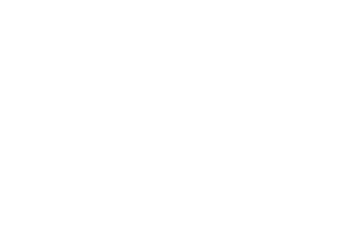

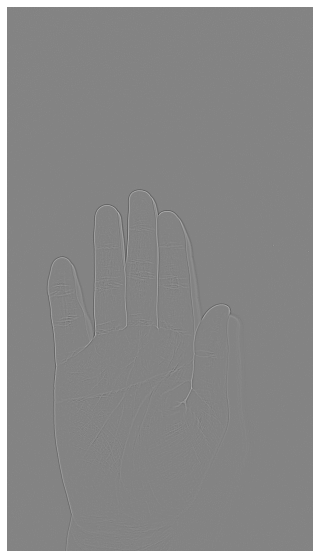

In [90]:
#エッジの検出処理
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image

img=cv2.imread("./test/arai/omote/0.jpg")
image = Image.open('./test/arai/omote/0.jpg')
#plt.subplot(1,2,1)
print("-------------------------------------------------------")
print("画像の中身")
print(img)
print("-------------------------------------------------------")
print("解像度")
print(image.size)
print("-------------------------------------------------------")
print("画像のモード")
#RGBの場合3x8 bit/pixel カラー画像
print(image.mode)
#plt.subplot(1,3,1)
#plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show

#グレイスケールの場合
image2 = Image.open('./graytest/arai/omote/0.jpg')
img2=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print("-------------------------------------------------------")
print("画像の中身")
print(img2)
print("-------------------------------------------------------")
print("解像度")
print(image2.size)
print("-------------------------------------------------------")
print("画像のモード")
print(image2.mode)
#Lの場合8 bit/pixel 白黒画像
plt.gray()
#plt.subplot(1,3,2)
#plt.imshow(img2)
plt.axis("off")
plt.show

#バイナリ値の場合
#img3 = cv2.imread('./graytest/arai/omote/0.jpg')
#エッジの検出
print(img2.dtype)
img2 = cv2.GaussianBlur(img2, (3, 3), 3)
edges = cv2.Laplacian(img2, cv2.CV_64F)
#edges=cv2.resize(edges,(photo_size,photo_size))
#image3 = Image.open("./binary.jpg")
print("-------------------------------------------------------")
print("画像の中身")
print(edges)
print("-------------------------------------------------------")
print("解像度")
#print(image3.size)
print("-------------------------------------------------------")
print("画像のモード")
#print(image3.mode)
#print(image3)
#Lの場合8 bit/pixel 白黒画像
plt.gray()
plt.figure(figsize=(10,10))
#plt.subplot(1,3,3)
plt.imshow(edges)
plt.axis("off")
plt.savefig('./edges.jpg')
plt.show()

In [10]:
#エッジ用のnumpy保存プログラム
import numpy as np
from PIL import Image
import cv2
import os,glob,random

outfile="./num16edgeslight128.npz"#変更必要
max_photo=40000
photo_size=128#変更必要
x=[]
y=[]

def main():
    glob_files("./grayhands/mine/omote",0)
    glob_files("./grayhands/mine/ura",1)
    glob_files("./grayhands/okutani/omote",2)
    glob_files("./grayhands/okutani/ura",3)
    glob_files("./grayhands/tochikubo/omote",4)
    glob_files("./grayhands/tochikubo/ura",5)
    glob_files("./grayhands/nakamura/omote",6)
    glob_files("./grayhands/nakamura/ura",7)
    glob_files("./grayhands/gotou/omote",8)
    glob_files("./grayhands/gotou/ura",9)
    glob_files("./grayhands/mimura/omote",10)
    glob_files("./grayhands/mimura/ura",11)
    glob_files("./grayhands/arai/omote",12)
    glob_files("./grayhands/arai/ura",13)
    glob_files("./grayhands/isii/omote",14)
    glob_files("./grayhands/isii/ura",15)
    #glob_files("./hands/saitouhide/omote",16)
    #glob_files("./hands/saitouhide/ura",17)
    #glob_files("./hands/saitouryou/omote",18)
    #glob_files("./hands/saitouryou/ura",19)
    #glob_files("./hands/sakuma/omote",20)
    #glob_files("./hands/sakuma/ura",21)
    #glob_files("./hands/tanaka/omote",22)
    #glob_files("./hands/tanaka/ura",23)
    #glob_files("./hands/tokuyama/omote",24)
    #glob_files("./hands/tokuyama/ura",25)
    #glob_files("./hands/watanabe/omote",26)
    #glob_files("./hands/watanabe/ura",27)
    #glob_files("./hands/yamaguchi/omote",28)
    #glob_files("./hands/yamaguchi/ura",29)
    #glob_files("./hands/sekine/omote",30)
    #glob_files("./hands/sekine/ura",31)
    #glob_files("./hands/toriumi/omote",32)
    #glob_files("./hands/toriumi/ura",33)
    #glob_files("./hands/aizawa/omote",34)
    #glob_files("./hands/aizawa/ura",35)
    np.savez(outfile,x=x,y=y)
    print("保存しました:"+outfile,len(x))
    print(x[0],y[0])
    
def glob_files(path,label):
    files=glob.glob(path+"/*.jpg")
    random.shuffle(files)
    num=0
    for f in files:
        if num>=max_photo: break
        num+=1
        
        #---------edgesの時のプログラム--------------
        img=cv2.imread(f)
        img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        img2 = cv2.GaussianBlur(img_gray, (3, 3), 3)
        edges = cv2.Laplacian(img2, cv2.CV_64F)
        edges=cv2.resize(edges,(photo_size,photo_size))
        
        
        edges=np.asarray(edges)#1つの配列に格納（この場合2つ）
        x.append(edges)
        y.append(label)
if __name__=='__main__':
    main()

保存しました:./num16edgeslight128.npz 3366
[[-0.5625   0.       0.40625 ... -0.8125  -1.46875  0.     ]
 [ 2.4375  -1.84375  0.40625 ...  0.      -0.15625 -1.875  ]
 [ 0.4375   1.3125  -0.59375 ...  0.59375  0.       1.     ]
 ...
 [ 0.4375   0.      -0.1875  ...  0.8125  -1.84375  0.5625 ]
 [-1.       2.0625   0.8125  ...  2.      -1.84375 -0.15625]
 [-1.28125  1.6875   0.1875  ...  0.      -0.3125  -1.28125]] 0


[[-0.5625   0.       0.40625 ... -0.8125  -1.46875  0.     ]
 [ 2.4375  -1.84375  0.40625 ...  0.      -0.15625 -1.875  ]
 [ 0.4375   1.3125  -0.59375 ...  0.59375  0.       1.     ]
 ...
 [ 0.4375   0.      -0.1875  ...  0.8125  -1.84375  0.5625 ]
 [-1.       2.0625   0.8125  ...  2.      -1.84375 -0.15625]
 [-1.28125  1.6875   0.1875  ...  0.      -0.3125  -1.28125]]
[[-2.       0.       0.78125 ... -0.59375  0.       0.     ]
 [-2.71875  0.6875   3.      ...  0.59375 -1.15625  0.15625]
 [-1.       1.84375 -0.1875  ...  0.      -2.      -1.28125]
 ...
 [ 1.15625  0.       1.      ...  0.8125  -1.15625 -0.875  ]
 [ 0.71875 -1.15625  0.59375 ... -0.96875 -0.6875   0.40625]
 [ 1.15625  0.84375  2.      ...  1.1875  -0.15625 -2.     ]]


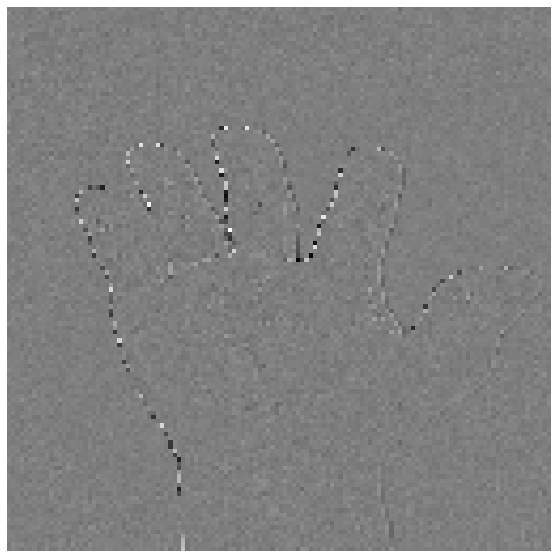

In [12]:
#エッジファイルの中身を確認するプログラム
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
#写真データ読み込み
photos=np.load('./num16edgeslight128.npz')
x=photos['x']
y=photos['y']
#開始インデックス
idx=1900
#pyplotで出力
plt.figure(figsize=(10,10))
plt.axis("off")
print(x[0])
print(x[1])
'''
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.axis("off")
    #グレイスケール画像を読み込むときは、plt.grayが必要
    #plt.gray
    plt.title(y[i+idx])
    plt.imshow(x[i+idx],cmap='gray')
    #plt.savefig('./extract.jpg')
'''
#--------------------画像1枚をピックアップして保存する-----------------------------
plt.imshow(x[0],cmap='gray')
#plt.imshow(x[1],cmap='gray')
plt.savefig('./edges.jpg')
plt.show()

Epoch 1/20
85/85 [==============================] - 61s 713ms/step - loss: 1.6327 - accuracy: 0.5007 - val_loss: 0.0281 - val_accuracy: 0.9881
Epoch 2/20
85/85 [==============================] - 60s 702ms/step - loss: 0.0234 - accuracy: 0.9922 - val_loss: 0.0023 - val_accuracy: 0.9985
Epoch 3/20
85/85 [==============================] - 60s 709ms/step - loss: 0.0242 - accuracy: 0.9955 - val_loss: 5.6549e-04 - val_accuracy: 1.0000
Epoch 4/20
85/85 [==============================] - 60s 708ms/step - loss: 0.1372 - accuracy: 0.9911 - val_loss: 0.0037 - val_accuracy: 0.9985
Epoch 5/20
85/85 [==============================] - 63s 745ms/step - loss: 0.0058 - accuracy: 0.9989 - val_loss: 2.3583e-04 - val_accuracy: 1.0000
Epoch 6/20
85/85 [==============================] - 62s 732ms/step - loss: 0.0074 - accuracy: 0.9978 - val_loss: 7.0984e-04 - val_accuracy: 1.0000
Epoch 7/20
85/85 [==============================] - 62s 725ms/step - loss: 0.0030 - accuracy: 0.9981 - val_loss: 1.1320e-08 - val_

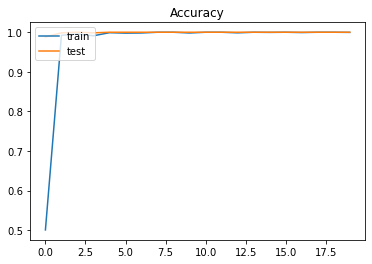

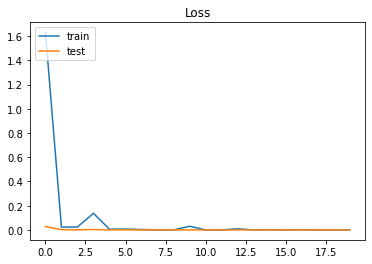

Wall time: 21min 16s


In [13]:
%%time
#エッジ検出を用いた機械学習
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes, activation='softmax'))
    return model

def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model


im_rows = 128 # 変更必要
im_cols = 128 # 変更必要
im_color = 1
in_shape = (im_rows, im_cols, im_color)
nb_classes = 16 #変更必要

photos = np.load('./num16edgeslight128.npz')#変更必要
x = photos['x']
y = photos['y']

x = x.reshape(-1, im_rows, im_cols, im_color)
x = x.astype('float32') / 255
y = keras.utils.to_categorical(y.astype('int32'), nb_classes)

x_train, x_test, y_train, y_test = train_test_split(
    x, y, train_size=0.8)

model = get_model(in_shape, nb_classes)


hist = model.fit(x_train, y_train,
          batch_size=32,
          epochs=20,
          verbose=1,
          validation_data=(x_test, y_test))

score = model.evaluate(x_test, y_test, verbose=1)
print('正解率=', score[1], 'loss=', score[0])


plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

model.save_weights('./hdf/num16edgeslight128pix.hdf5') #変更必要

In [15]:
#エッジ検出を用いた機械学習
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes, activation='softmax'))
    return model


def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model

#全員用の配列(本人受入率)
'''
omote=["arai/omote","gotou/omote","isii/omote",
       "mimura/omote","mine/omote","nakamura/omote",
       "okutani/omote","saitouhide/omote","saitouryou/omote",
       "sakuma/omote","tanaka/omote","tochikubo/omote",
       "tokuyama/omote","watanabe/omote",
       "yamaguchi/omote"]
ura=["arai/ura","gotou/ura","isii/ura",
       "mimura/ura","mine/ura","nakamura/ura",
       "okutani/ura","saitouhide/ura",
       "saitouryou/ura","sakuma/ura","tanaka/ura",
       "tochikubo/ura","tokuyama/ura","watanabe/ura",
       "yamaguchi/ura"]
'''

#他人受入率用のテスト配列
omote=["saitouhide/omote","saitouryou/omote",
      "sakuma/omote","tanaka/omote","tokuyama/omote","watanabe/omote",
      "yamaguchi/omote"]
ura=["saitouhide/ura","saitouryou/ura",
      "sakuma/ura","tanaka/ura","tokuyama/ura","watanabe/ura",
      "yamaguchi/ura"]
target_omote=[]
target_ura=[]
for k in range(7):#変更必要
    for i in range(10):
        target_omote.append("./graytest/"+str(omote[k])+"/"+str(i)+".jpg")#変更必要
        target_ura.append("./graytest/"+str(ura[k])+"/"+str(i)+".jpg")#変更必要

#target_omote="./test/3nensei/arai/omote/1.jpg"#変更必要
#target_ura="./test/3nensei/arai/ura/1.jpg"#変更必要

im_rows = 128 #変更必要
im_cols = 128 #変更必要
im_color = 1 #変更必要
in_shape = (im_rows, im_cols, im_color)
nb_classes = 16 #変更必要
#全員用のラベル(本人受入率)
'''
LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
        "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
        "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
        "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏",
        "斎藤ひであきさんの表","斎藤ひであきさんの裏","斎藤りょうがさんの表",
        "斎藤りょうがさんの裏","佐久間さんの表","佐久間さんの裏",
        "田中さんの表","田中さんの裏","徳山さんの表","徳山さんの裏",
        "渡邉さんの表","渡邉さんの裏","山口さんの表","山口さんの裏"]
      #  "関根さんの表","関根さんの裏","鳥海さんの表","鳥海さんの裏",
      #  "相澤さんの表","相澤さんの裏"]
'''
#他人受入率用のラベル
LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
       "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
       "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
       "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏"]

model = get_model(in_shape, nb_classes)
model.load_weights('./hdf/num16edgeslight128pix.hdf5')#変更必要

def check_photo(path):
    img=Image.open(path)
    #img=img.convert("RGB")
    img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    img2 = cv2.GaussianBlur(img_gray, (3, 3), 3)
    img3 = cv2.Laplacian(img2, cv2.CV_64F)
    img3=img3.resize((im_cols,im_rows))
    plt.imshow(img,cmap='gray')
    plt.show()

    x=np.asarray(img)
    x=x.reshape(-1,im_rows,im_cols,im_color)
    x=x/255
    
    #予測
    pre=model.predict([x])[0]#画像の予測
    idx=pre.argmax()
    per=(pre[idx]*100)
    #per=int(pre[idx]*100)
    return(idx,per)

def check_photo_str(path):
    idx,per=check_photo(path)
    if per>=99:
        print("この写真は、",LABELS[idx],"です。")
        print("可能性は、",per,"%です。")
    else:
        print('\033[31m'+"可能性が",per,"%なので認証できません。"+'\033[31m')
        print("認証の結果は",LABELS[idx],"でした。")
    
if __name__=='__main__':
    number=[9,19,29,39,49,59,69,79,89,99,109,119,129,139,149]
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_omote[i])
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_ura[i])
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")


ここからは0番目の写真です


error: OpenCV(4.5.4) :-1: error: (-5:Bad argument) in function 'cvtColor'
> Overload resolution failed:
>  - src is not a numpy array, neither a scalar
>  - Expected Ptr<cv::UMat> for argument 'src'
